In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from google.colab import files
uploaded = files.upload()

Saving googleplaystore.csv to googleplaystore.csv


# <font color='red'>READING THE DATASET</font>
### The first step in any machine learning problem is reading the data from a given file format, in this case we have a csv file from where we will read the data.

In [130]:
import io
Application_data = pd.read_csv(io.BytesIO(uploaded['googleplaystore.csv']))

# <font color='red'>CLEANING THE DATASET
### The dataset will have redundant values like NaN, or some columns will not have any value at all, some columns will have unrelated values, some will be having some special charcters which cannot be feeded to our machine learning model. So these inconsistencies will be resolved in this section using basic python skills and pandas tricks.

In [21]:
Application_data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBoo,ART_AND_DESIGN,4.0,159,19.0,"10,000",Free,0,Everyone,Art & Design,7-Jan-18,1.0.0,4.0.3 and up
1,Coloring boo moana,ART_AND_DESIGN,4.0,967,14.0,500000,Free,0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up
2,U Launcher Lite – FREE Live Cool Themes Hide Apps,ART_AND_DESIGN,5.0,87510,8.7,5000000,Free,0,Everyone,Art & Design,1-Aug-18,1.2.4,4.0.3 and up
3,Setch - Draw & Paint,ART_AND_DESIGN,5.0,215644,25.0,50000000,Free,0,Teen,Art & Design,8-Jun-18,0,4.2 and up
4,Pixel Draw - Number Art Coloring Boo,ART_AND_DESIGN,4.0,967,2.8,100000,Free,0,Everyone,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up


In [22]:
Application_data.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')

In [23]:
Application_data.describe()

,Rating,Reviews,Size
count,9367.000000,9.367000e+03,9367.000000
mean,4.221320,5.143152e+05,30.871357
std,0.629901,3.143979e+06,86.692523
min,1.000000,1.000000e+00,0.000000
25%,4.000000,1.865000e+02,2.900000
50%,4.000000,5.933000e+03,11.000000
75%,5.000000,8.157850e+04,30.000000
max,5.000000,7.815831e+07,1000.000000


## Lets move from left to right in the columns of the dataset, we start from <font color='red'>"RATING"</font> column, and move till <font color='red'>"PRICE"</font> column, since these are the numeric columns and are neccessary features for our model. We will do following process on each of these columns:
#### 1)- Checking all the unique values in the column.
#### 2)- If there are some unrelated unique values which are not significant, these will be replaced.
#### 3)- The null check is performed on each numerical column, if null entries are found, they are replaced with the mean values.
#### 4)- The values in the columns contain some special characters, that needs to be removed in order to perform aggregations, so those will be removed like "+" and "," in Installs column, "M", "Varies with Device" and "k" from Size column etc.
#### 5)- The columns that are in object type will be converted to their numerical counterparts for analysis and trends.
#### 6)- Final filtration will be done to make sure there is no inconsistency in any column that may affect the performance of our model.

# <font color='red'>"RATING" column cleaning by following the 6 steps

In [24]:
#Checking whether there are null values in the Ratings column
nullcheck_ratings=pd.isnull(Application_data["Rating"])
Application_data[nullcheck_ratings]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver


In [25]:
#Replacing the NaN values with the mean rating value
Application_data["Rating"].fillna(value=Application_data["Rating"].mean(),inplace=True)
Application_data["Rating"]


0       4.0
1       4.0
2       5.0
3       5.0
4       4.0
       ... 
9362    4.0
9363    5.0
9364    5.0
9365    5.0
9366    5.0
Name: Rating, Length: 9367, dtype: float64

In [26]:
# Checking the unique values in the Rating column,we find there is an inconsistent value of 19.
Application_data["Rating"].unique()

array([4. , 5. , 3. , 2. , 1. , 4.1])

In [27]:
# Replacing the inconsistent value with the mean value of ratings
Application_data["Rating"].replace(19.,4.1,inplace=True)

#### There was no special character found in the ratings column, so step 4 is not required. Moreover, the datatype of ratings column is already float, so no need for the conversion. So now our Rating column is ready for analysis.

# <font color='red'>"REVIEWS" column cleaning by following the 6 steps

In [28]:
# Checking the unique values of the number of reviews column, we find there are no unrelated values.
len(Application_data["Reviews"].unique())

5993

In [29]:
# Checking the Null values of the number of reviews column, we find there are no null values.
nullcheck_reviews=pd.isnull(Application_data["Reviews"])
Application_data[nullcheck_reviews]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver


In [30]:
# Checking for any special character that might prevent numeric conversion, 3.0M is replaced with its real value to make the data consistent.
Application_data["Reviews"].replace("3.0M","3000000",inplace=True)

In [31]:
# Finally converting the datatype of Reviews column from Object type(String) to Numeric type(float or int)
Application_data["Reviews"]=pd.to_numeric(Application_data["Reviews"])

#### All the steps have been completed for the reviews column and it is also ready for the analysis.

#  <font color='red'>"SIZE" column cleaning by following the 6 steps

In [32]:
# Checking for the unique values of the Size column, it is observed it has values appended with M,k and "Varies with device"
Application_data["Size"].unique()

array([  19. ,   14. ,    8.7,   25. ,    2.8,    5.6,   29. ,   33. ,
          3.1,   28. ,   12. ,   20. ,   21. ,   37. ,    2.7,    5.5,
         17. ,   39. ,   31. ,    4.2,   23. ,    6. ,    6.1,    4.6,
          9.2,    5.2,   11. ,   24. ,    0. ,    9.4,   15. ,   10. ,
          1.2,   26. ,    8. ,    7.9,   56. ,   57. ,   35. ,   54. ,
        201. ,    3.6,    5.7,    8.6,    2.4,   27. ,    2.5,    7. ,
         16. ,    3.4,    8.9,    3.9,    2.9,   38. ,   32. ,    5.4,
         18. ,    1.1,    2.2,    4.5,    9.8,   52. ,    9. ,    6.7,
         30. ,    2.6,    7.1,   22. ,    6.4,    3.2,    8.2,    4.9,
          9.5,    5. ,    5.9,   13. ,   73. ,    6.8,    3.5,    4. ,
          2.3,    2.1,   42. ,    9.1,   55. ,    7.3,    6.5,    1.5,
          7.5,   51. ,   41. ,   48. ,    8.5,   46. ,    8.3,    4.3,
          4.7,    3.3,   40. ,    7.8,    8.8,    6.6,    5.1,   61. ,
         66. ,   79. ,    8.4,    3.7,  118. ,   44. ,  695. ,    1.6,
      

In [33]:
# Replacing the "Varies with device" field with NaN entry, so that later on these can be replaced with mean values.
Application_data['Size'].replace('Varies with device', np.nan, inplace = True )
Application_data['Size'].replace('1,000+', np.nan, inplace = True )


In [34]:
# Checking for null values which we will find, since in the above line we have added few null values.
nullcheck_size=pd.isnull(Application_data["Size"])
Application_data[nullcheck_size]


,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver


#### Now we need to replace the NaN values with the mean size of all the applications, but we cannot calculate mean since our column is of Object type String, so we need to convert it into a numeric type. Moreover, we need to remove "M", "k" from the values of the column, since we cannot convert them to numeric without handling these special symbols.

In [38]:
# Finally replacing the NaN values with the mean value.
Application_data["Size"].fillna(value="21516530",inplace=True)

In [39]:
# After removing the special characters, lets convert it to numeric data type for finding the mean value.
Application_data["Size"]=pd.to_numeric(Application_data["Size"])

#### Here we have completed the cleaning of the Size column by following all the 6 steps which were required, since this column was very uncleaned.

# <font color='red'>"INSTALL" column cleaning by following the 6 steps

In [40]:
# Checking the unique values of the column Installs, we observe that there is a type called "free", which is inconsistent and non numeric, so it should be replaced.
Application_data["Installs"].unique()

array(['10,000', '500000', '5000000', '50000000', '100000', '50,000',
       '1000000', '10000000', '5,000', '100000000', '1000000000', '1,000',
       '500000000', '100', '500', '10', '5', '50', '1', 'Free'],
      dtype=object)

#### We need to remove the "free" with the average number of installs for the applications, but for calculating the average, we need to remove the "+" and "," from the values. After removing them, we will have to convert these into numeric type and then we can calculate the mean and finally substitute the mean value in place of "Free".

In [41]:
# Removing the "+" symbol to make the column numeric.
Application_data["Installs"]=Application_data["Installs"].map(lambda x: x.rstrip('+'))

In [42]:
# Removing the "," from the digits to make it easier.
Application_data["Installs"]=Application_data["Installs"].str.replace(",","")

In [43]:
# There was no null entries found in this column
nullcheck_installs=pd.isnull(Application_data["Installs"])
Application_data[nullcheck_installs]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver


In [44]:
# Replacing the inconsistent label value with the mean value of the column.
Application_data["Installs"].replace("Free","15462910",inplace=True)

In [45]:
# Converting the Datatype to the numeric type for analysis
Application_data["Installs"]=pd.to_numeric(Application_data["Installs"])

#### In this way, we have made our Installs column ready for the analysis by following all the 6 steps again.

# <font color='red'>"TYPE" column cleaning by following the 6 steps

In [46]:
# Checking for the unique values, we found nan and 0 which should be replaced with Free.
Application_data["Type"].unique()

array(['Free', 'Paid', '0'], dtype=object)

In [47]:
# Replacing 0 with Free
Application_data["Type"].replace("0","Free",inplace=True)


In [48]:
# Filling the missing values with Free, since most of the applications are free on Google play.
Application_data["Type"].fillna(value="Free",inplace=True)

In [49]:
# Addding the dummy columns for this, so that it can contribute to our model.
dummy_type=pd.get_dummies(Application_data["Type"])

In [50]:
#Concatenating the dummy columns with the main dataframe.
Application_data=pd.concat([Application_data,dummy_type],axis=1)

In [51]:
# Finally dropping the type column.
Application_data.drop(["Type"],axis=1,inplace=True)

In [52]:
Application_data.head()

,App,Category,Rating,Reviews,Size,Installs,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Free,Paid
0,Photo Editor & Candy Camera & Grid & ScrapBoo,ART_AND_DESIGN,4.0,159,19.0,10000,0,Everyone,Art & Design,7-Jan-18,1.0.0,4.0.3 and up,1,0
1,Coloring boo moana,ART_AND_DESIGN,4.0,967,14.0,500000,0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up,1,0
2,U Launcher Lite – FREE Live Cool Themes Hide Apps,ART_AND_DESIGN,5.0,87510,8.7,5000000,0,Everyone,Art & Design,1-Aug-18,1.2.4,4.0.3 and up,1,0
3,Setch - Draw & Paint,ART_AND_DESIGN,5.0,215644,25.0,50000000,0,Teen,Art & Design,8-Jun-18,0,4.2 and up,1,0
4,Pixel Draw - Number Art Coloring Boo,ART_AND_DESIGN,4.0,967,2.8,100000,0,Everyone,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up,1,0


#### In this way we have removed the Type categorical column, used dummy columns to make our feature space more accurate.

# <font color='red'>"PRICE" column cleaning by following the 6 steps

In [53]:
# By checking the unique values we observe that "Everyone" is an inconsistent value that should be removed.
Application_data["Price"].unique()

array(['0', '4.99', '3.99', '6.99', '7.99', '5.99', '2.99', '3.49',
       '1.99', '9.99', '7.49', '0.99', '9', '5.49', '10', '24.99',
       '11.99', '79.99', '16.99', '14.99', '29.99', '12.99', '2.49',
       '10.99', '1.5', '19.99', '15.99', '33.99', '39.99', '3.95', '4.49',
       '1.7', '8.99', '1.49', '3.88', '399.99', '17.99', '400', '3.02',
       '1.76', '4.84', '4.77', '1.61', '2.5', '1.59', '6.49', '1.29',
       '299.99', '379.99', '37.99', '18.99', '389.99', '8.49', '1.75',
       '14', '2', '3.08', '2.59', '19.4', '3.9', '4.59', '15.46', '3.04',
       '13.99', '4.29', '3.28', '4.6', '1', '2.95', '2.9', '1.97', '2.56',
       'Everyone', '1.2'], dtype=object)

#### Here to get the mean of the values, the datatype of the column should be numeric and for that to happen we need to remove the dollar symbol from the values and drop the everyone row, since it contains redundant data that will compromise the performance of our model.

In [54]:
# Removing the dollar symbol
Application_data["Price"]=Application_data["Price"].map(lambda x: x.lstrip('$'))

In [55]:
# Removing the non essential row value.
Application_data.drop(Application_data[Application_data["Price"] == "Everyone"].index, inplace=True)

In [56]:
# By checking there were no null values found
nullcheck_Prices=pd.isnull(Application_data["Price"])
Application_data[nullcheck_Prices]

,App,Category,Rating,Reviews,Size,Installs,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Free,Paid


In [57]:
# Finally converting to numeric type for analysis
Application_data["Price"]=pd.to_numeric(Application_data["Price"])

#### We have cleaned the Price column by following all the 6 steps as per the requirement, now this column is ready for the analysis.

# <font color='red'>"CATEGORY" column cleaning by following the 6 steps

In [58]:
# Checking the unique values, we found 
Application_data["Category"].unique()

array(['ART_AND_DESIGN', 'AUTO_AND_VEHICLES', 'BEAUTY',
       'BOOS_AND_REFERENCE', 'BUSINESS', 'COMICS', 'COMMUNICATION',
       'DATING', 'EDUCATION', 'ENTERTAINMENT', 'EVENTS', 'FINANCE',
       'FOOD_AND_DRIN', 'HEALTH_AND_FITNESS', 'HOUSE_AND_HOME',
       'LIBRARIES_AND_DEMO', 'LIFESTYLE', 'GAME', 'FAMILY', 'MEDICAL',
       'SOCIAL', 'SHOPPING', 'PHOTOGRAPHY', 'SPORTS', 'TRAVEL_AND_LOCAL',
       'TOOLS', 'PERSONALIZATION', 'PRODUCTIVITY', 'PARENTING', 'WEATHER',
       'VIDEO_PLAYERS', 'NEWS_AND_MAGAZINES', 'MAPS_AND_NAVIGATION'],
      dtype=object)

In [59]:
Application_data["Category"].replace("1.9","MISCELLANEOUS",inplace=True)

In [60]:
# Checking for null values, there were no null values found for this column
nullcheck=pd.isnull(Application_data["Category"])
Application_data[nullcheck]

,App,Category,Rating,Reviews,Size,Installs,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Free,Paid


#### For this column, we will perform the label encoding and not the dummies, since by making dummies there will be too many extra columns added to our feature matrix that is not required, so label encoding is done by providing numerical values to each and every category of application.

In [61]:
# Importing the required library
from sklearn.preprocessing import LabelEncoder

In [62]:
# Instantiating the encoder
labelencoder2 = LabelEncoder()

In [63]:
#Encoding the Ctegory column using scikit learn
Application_data['Categories_encoded'] = labelencoder2.fit_transform(Application_data['Category'])

In [64]:
# finally dropping the type column, since it is already splitted.
Application_data.drop(["Category"],axis=1,inplace=True)

In [65]:
Application_data.head()

,App,Rating,Reviews,Size,Installs,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Free,Paid,Categories_encoded
0,Photo Editor & Candy Camera & Grid & ScrapBoo,4.0,159,19.0,10000,0.0,Everyone,Art & Design,7-Jan-18,1.0.0,4.0.3 and up,1,0,0
1,Coloring boo moana,4.0,967,14.0,500000,0.0,Everyone,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up,1,0,0
2,U Launcher Lite – FREE Live Cool Themes Hide Apps,5.0,87510,8.7,5000000,0.0,Everyone,Art & Design,1-Aug-18,1.2.4,4.0.3 and up,1,0,0
3,Setch - Draw & Paint,5.0,215644,25.0,50000000,0.0,Teen,Art & Design,8-Jun-18,0,4.2 and up,1,0,0
4,Pixel Draw - Number Art Coloring Boo,4.0,967,2.8,100000,0.0,Everyone,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up,1,0,0


# <font color='red'>"CONTENT RATING" Column cleaning by 6 Steps

#### For this categorical column also, we are doing the label encoding similarly we did for the Category column.

In [66]:
# Checking for unique values
Application_data["Content Rating"].unique()

array(['Everyone', 'Teen', 'Everyone 10', 'Mature 17', 'Adults only 18',
       'Unrated'], dtype=object)

In [67]:
# Null check for Content Rating
nullcheck_contentrating=pd.isnull(Application_data["Content Rating"])
Application_data[nullcheck_contentrating]

,App,Rating,Reviews,Size,Installs,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Free,Paid,Categories_encoded


In [68]:
# importing the required package
from sklearn.preprocessing import LabelEncoder

In [69]:
#instantiating the encoder
labelencoder = LabelEncoder()

In [70]:
# encoding the column
Application_data['Content_Rating_encoded'] = labelencoder.fit_transform(Application_data['Content Rating'])

In [71]:
# finally removing the content ratig column after encoding
Application_data.drop(["Content Rating"],axis=1,inplace=True)

In [72]:
Application_data.head()

,App,Rating,Reviews,Size,Installs,Price,Genres,Last Updated,Current Ver,Android Ver,Free,Paid,Categories_encoded,Content_Rating_encoded
0,Photo Editor & Candy Camera & Grid & ScrapBoo,4.0,159,19.0,10000,0.0,Art & Design,7-Jan-18,1.0.0,4.0.3 and up,1,0,0,1
1,Coloring boo moana,4.0,967,14.0,500000,0.0,Art & Design;Pretend Play,15-Jan-18,2.0.0,4.0.3 and up,1,0,0,1
2,U Launcher Lite – FREE Live Cool Themes Hide Apps,5.0,87510,8.7,5000000,0.0,Art & Design,1-Aug-18,1.2.4,4.0.3 and up,1,0,0,1
3,Setch - Draw & Paint,5.0,215644,25.0,50000000,0.0,Art & Design,8-Jun-18,0,4.2 and up,1,0,0,4
4,Pixel Draw - Number Art Coloring Boo,4.0,967,2.8,100000,0.0,Art & Design;Creativity,20-Jun-18,1.1,4.4 and up,1,0,0,1


In [73]:
# Checking the datatypes of the columns to ensure that we have successfully gathered all the numerical columns.
Application_data.dtypes

App                        object
Rating                    float64
Reviews                     int64
Size                      float64
Installs                    int64
Price                     float64
Genres                     object
Last Updated               object
Current Ver                object
Android Ver                object
Free                        uint8
Paid                        uint8
Categories_encoded          int64
Content_Rating_encoded      int64
dtype: object

In [74]:
# Finding the mean of all the numerical columns
Application_data.mean()

<ipython-input-74-5013f1760bbc>:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  Application_data.mean()


Rating                    4.221332e+00
Reviews                   5.140498e+05
Size                      3.076788e+01
Installs                  1.789744e+07
Price                     9.609278e-01
Free                      9.309204e-01
Paid                      6.907965e-02
Categories_encoded        1.679970e+01
Content_Rating_encoded    1.488149e+00
dtype: float64

# <font color='red'>EXPLORATORY DATA ANALYSIS</font>
## <font color='blue'>Below there is a complete analysis of various relationships between the features of our data. This is required so that we can understand what all features will play a significant role when predicting the number of installs for any application.</font>

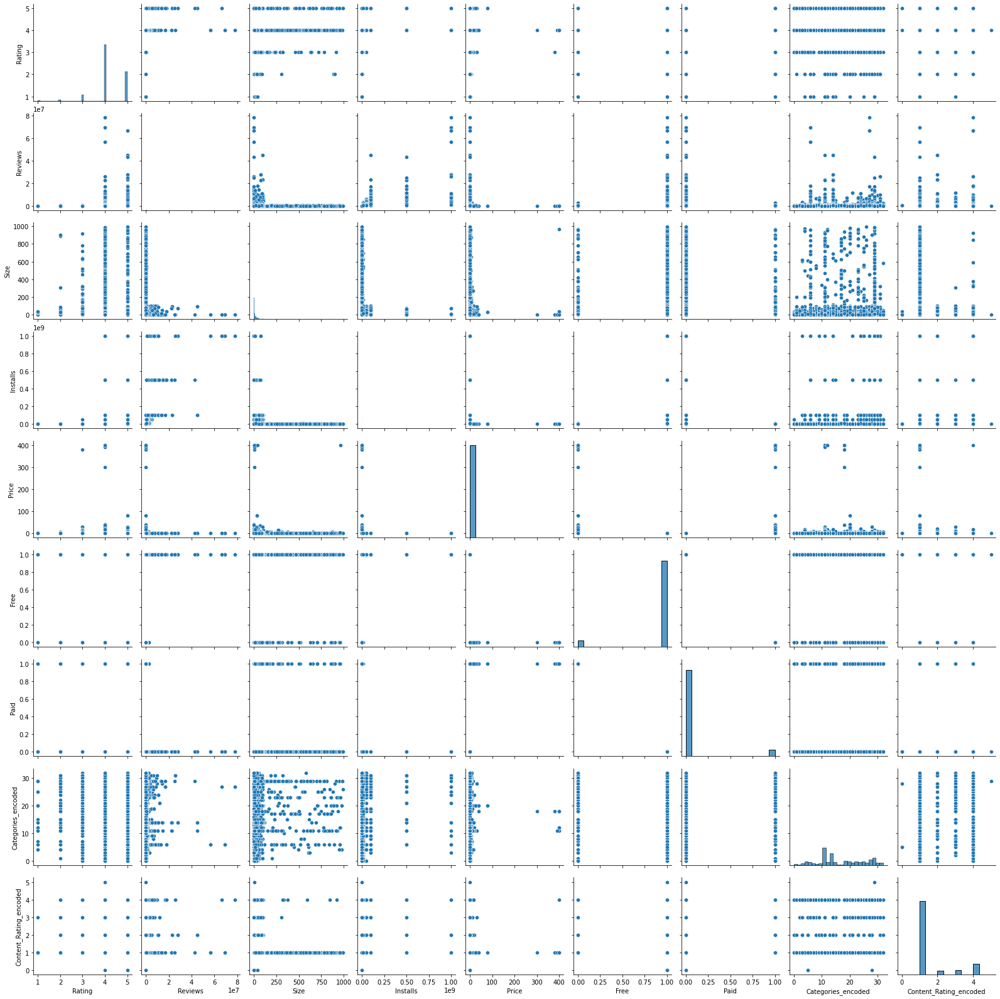

In [75]:
sns.pairplot(Application_data)

#### Here a pairplot is shown between all the numerical columns of the data. This gives a high level of intuition between the relationships between the various features. Now firstly, histograms will be drawn for all the numerical columns just to know thier counts and distribution. Plotly is used here for graphical representations.

In [76]:
colorassigned=Application_data["Rating"]
fig = px.histogram(Application_data, x="Rating", marginal="rug",
                   hover_data=Application_data.columns,nbins=30,color=colorassigned)
fig.show()

#### The above Graph is an Histogram, that shows the distribution of ratings of various android applications. The histogram is divided into colors based on the values of the rating. The color scale is given on the right side. The count of rating 4.1 is maximum(1474) as can be found by hovering on the graph. Moreover, the count of rating uniformly increases from 3.4(128) to going to maximum of 4.1(1474), and then again going up and down. This means most of the applications on google play have their ratings between 4 to 4.5.

In [77]:
fig = px.histogram(Application_data, x="Reviews", marginal="rug",
                   hover_data=Application_data.columns,nbins=30)
fig.show()

#### This is an histogram to show the distribution of number of reviews for each application. It is quite clearly visible that, 90% of the applications on Google play store have reviews less than 5 million. 138 applications have reviews between 5 Million to 10 Million. Only 47 android applications have reviews between 10 Million to 15 Million. So majority of the applications have less then 5 Million reviews.

In [78]:
colorassigned=Application_data["Size"]
fig = px.histogram(Application_data, x="Size", marginal="rug",
                   hover_data=Application_data.columns,nbins=30,color=colorassigned)
fig.show()

#### The above Graph is an Histogram, that shows the distribution of size of various android applications. It can be observed that most of the applications have lesser size, since as the size increases on the x-axis, the bars are getting shorter and shorter, which means the count of such types of apps is decreasing. So we have more applications on Google playstore that are smaller in size than the larger ones. Most of the applications have the size of around 21.5 MB.

In [79]:
colorassigned=Application_data["Installs"]
fig = px.histogram(Application_data, x="Installs", marginal="rug",
                   hover_data=Application_data.columns,nbins=30,color=colorassigned)
fig.show()

#### The above graph shows the number of installs of the android applications. It can be observed that majority of the applications have less than 10 Million installs. Moreover, there are only 58 applications that have more than 1 billion installs on Google play.

In [80]:
colorassigned=Application_data["Price"]
fig = px.histogram(Application_data, x="Price", marginal="rug",
                   hover_data=Application_data.columns,nbins=30,color=colorassigned)
fig.show()

#### This histogram shows the price distribution of various android applications on Google play. Majority of the applications are free of cost. There are 12 android applications that are the most expensive costing 400 bucks. 

## <font color='red'>With this we have completed the individual analysis of all the numerical columns of our dataset. Now we will find the relation between each column to analyse deeply. The step that is followed below is:
### 1)- Calculate the correlation value and draw a heatmap to know the correlation between different columns.
### 2)- Once we find the correlation, then we know which columns are affecting one another, then we start plotting columns in pair of two based on thier correlation values. If the correlation is negative or very less, there is no point in plotting those columns.
### 3)- After plotting we will fit a linear regression line to our data points. The more the correlation value, better line of fit we get.


In [81]:
# Calculating the Correlation and plotting the heatmap to know the relations.
cors=Application_data.corr()
fig = px.imshow(cors,labels=dict(color="Pearson Correlation"), x=['Rating', 'Reviews', 'Size', 'Installs', 'Price','Paid','Free','Content_Rating_encoded','Categories_encoded'],
                y=['Rating', 'Reviews', 'Size','Installs','Price','Paid','Free','Content_Rating_encoded','Categories_encoded'])
fig.show()

## <font color='red'>Following inferences can be drawn from this heatmap:
###<font color='blue'> CORRELATION VALUE                                FEATURES INVOLVED                                              VERDICT

###             -0.020                                                      Price vs Rating                                                    No Correlation

###             -0.009                                                      Price vs Reviews                                                 No Correlation

###             -0.022                                                      Price vs Size                                                        No Correlation

###             -0.011                                                      Price vs Installs                                                   No Correlation

###              0.051                                                      Installs vs Rating                                                 No Correlation

###              0.643                                                      Installs vs Reviews                                              Great Correlation

###              0.082                                                      Installs vs Size                                                     No Correlation

###             -0.011                                                      Installs vs Price                                                   No Correlation

###              0.074                                                      Size vs Rating                                                      No Correlation

###              0.128                                                      Size vs Reviews                                                 Very less Correlation

###              0.082                                                      Size vs Installs                                                    No Correlation

###             -0.022                                                      Size vs Price                                                        No Correlation

###              0.067                                                      Reviews vs Rating                                              No Correlation



## We will be plotting only those relations whose correlation value is greater than 0.1, rest all do not have any correlation, so plotting will not be fruitful. 

In [82]:
# Plotting scatter plot with a line of fit between Installs and Reviews, these two have the highest Correlation between them.
from scipy.stats import pearsonr 
corryu,_ =pearsonr(Application_data["Installs"],Application_data["Reviews"])
colorassigned=Application_data["Reviews"]
fig = px.scatter(Application_data, x="Installs", y="Reviews",trendline="ols",color=colorassigned)
fig.show()
print("Pearson Correlation: %.3f" % corryu)
print("P-value: %.8f" % _)

Pearson Correlation: 0.642
P-value: 0.00000000


###### It is observed that we have a good fit to the data points, since the correlation between these 2 columns is significant. As it is visible, as the number of installs increases, the number of reviews are also increasing which makes sense, since if the user has installed the application, then only they can give feedback to it. Without using an application, reviews cannot be given. If we get a new data point, we can predict its number of installs based on the number of reviews. By hovering on the red line, the equation of the straight line can be seen. Hovering on each data point gives its installs and reviews at that point.

In [83]:
# Plotting scatter plot with a line of fit between Rating and Reviews, these two have very less correlation between them. 
from scipy.stats import pearsonr 
corryu,_ =pearsonr(Application_data["Rating"],Application_data["Reviews"])
colorassigned=Application_data["Reviews"]
fig = px.scatter(Application_data, x="Rating", y="Reviews",trendline="ols",color=colorassigned)
fig.show()
print("Pearson Correlation: %.3f" % corryu)
print("P-value: %.8f" % _)

Pearson Correlation: 0.067
P-value: 0.00000000


###### As can be observed from this graph, we can see that the applications that have ratings between 4 to 4.7 have maximum number of reviews. However, we cannot say that as the ratings increases the reviews increases, this happens just for a particular range of 4 to 4.7 where Reviews increase as the ratings increase but before 4 and after 4.7 there is different trend. It is observed that after rating 4.7, the count of number of reviews have reduced, that is the applications to which review is given is reduced. The apps having 5 star rating have only 4 reviews. However, the apps having rating less then 4 have been rated by many users.

In [84]:
# Plotting scatter plot with a line of fit between Size and Reviews, these two have very less correlation between them. 
from scipy.stats import pearsonr 
corryu,_ =pearsonr(Application_data["Size"],Application_data["Reviews"])
colorassigned=Application_data["Reviews"]
fig = px.scatter(Application_data, x="Size", y="Reviews",trendline="ols",color=colorassigned)
fig.show()
print("Pearson Correlation: %.3f" % corryu)
print("P-value: %.8f" % _)

Pearson Correlation: -0.006
P-value: 0.59392627


###### There is no general trend observed in this graph, since there is very less correlation observed in these two columns. There are applications of size 21 MB getting 80 Million reviews, and there are applications with larger size like 98 MB, getting 45 million reviews. So there is no trend observed here.

In [85]:
from scipy.stats import pearsonr 
corryu,_ =pearsonr(Application_data["Installs"],Application_data["Categories_encoded"])
colorassigned=Application_data["Categories_encoded"]
fig = px.scatter(Application_data, x="Installs", y="Categories_encoded",trendline="ols",color=colorassigned)
fig.show()
print("Pearson Correlation: %.3f" % corryu)
print("P-value: %.8f" % _)

Pearson Correlation: 0.023
P-value: 0.02759811


# <font color='red'>MODEL BUILDING AND EVALUATION USING SKLEARN

### The final step is creating the model that will predict the number of installs for an android application on Google play. We will be using 3 regressors for this purpose, Linear, DecisonTree and RandomForest. Finally the performance for all the 3 will be compared in the graphical format.

## <font color='red'>LINEAR REGRESSOR 

In [86]:
# Splitting the target variable and the feature matrix
X=Application_data[["Reviews","Size","Rating","Price","Paid","Free","Categories_encoded","Content_Rating_encoded"]]
y=Application_data["Installs"]

In [87]:
# importing train test set
from sklearn.model_selection import train_test_split

In [88]:
# splitting the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [89]:
# importing linear regressor
from sklearn.linear_model import LinearRegression

In [90]:
# Instantiating linear regressor
lm=LinearRegression()

In [91]:
# Fitting the model
lm.fit(X_train,y_train)

LinearRegression()

In [92]:
# making predictions on the test set
predictions=lm.predict(X_test)

In [93]:
# displaying predictions
predictions

array([ 5927237.59825849,  7990723.90301782, 16046130.85738287, ...,
       13112037.23475433, -5250877.41412208, 10702644.56480372])

In [94]:
# Accuracy score for Linear regressor
linearregressionscore=lm.score(X_test,y_test)
linearregressionscore

0.48233071309859266

In [95]:
# The coefficient for Linear regressor per feature.
lm.coef_

array([ 1.71667543e+01, -2.74623789e+04, -1.80911470e+06,  5.92866061e+03,
       -4.62489788e+06,  4.62489788e+06,  2.86141985e+05,  1.66756775e+06])

#### Evaluating the metrics for linear regresssor, the mean absolute error, mean squared error and finally root mean square error.

In [96]:
# Importing the metrics
from sklearn import metrics

In [97]:
# Mean absolute error on test data
metrics.mean_absolute_error(y_test,predictions)

16375761.78292479

In [98]:
# Mean squared error on test data
metrics.mean_squared_error(y_test,predictions)

4113536085168249.0

In [99]:
# Root mean squared error on test data
rmelinear=np.sqrt(metrics.mean_absolute_error(y_test,predictions))
rmelinear

4046.6976391775047

# <font color='red'>DECISION TREE REGRESSOR

In [100]:
# Defining the feature matrix and the target variable
X=Application_data[["Reviews","Size","Rating","Price","Paid","Free","Categories_encoded","Content_Rating_encoded"]]
y=Application_data["Installs"]

In [101]:
# Importing the train test split
from sklearn.model_selection import train_test_split

In [102]:
# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [103]:
# Importing the regressor
from sklearn.tree import DecisionTreeRegressor

In [104]:
# Instantiating the regressor
decisiontreereg=DecisionTreeRegressor()

In [105]:
# Fitting the model
decisiontreereg.fit(X_train,y_train)

DecisionTreeRegressor()

In [106]:
# Gettting the predicted values
y_prediction=decisiontreereg.predict(X_test)

In [107]:
# The accuracy score for decision tree regressor
decisiontreescore=decisiontreereg.score(X_test,y_test)
decisiontreescore

0.8790990694733419

In [108]:
from sklearn import metrics

In [109]:
# Mean absolute error
metrics.mean_absolute_error(y_test,y_prediction)

4109858.1046263347

In [110]:
# Root mean square error
rmetree=np.sqrt(metrics.mean_absolute_error(y_test,y_prediction))
rmetree

2027.2784970561727

# <font color='red'>RANDOM FOREST REGRESSOR

In [111]:
# Separating the feature matrix and target variable
X=Application_data[["Reviews","Size","Rating","Price","Paid","Free","Categories_encoded","Content_Rating_encoded"]]
y=Application_data["Installs"]

In [112]:
# Importing the train test split
from sklearn.model_selection import train_test_split

In [113]:
# Splitting the training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [114]:
# Importing the random forest regressor
from sklearn.ensemble import RandomForestRegressor

In [115]:
# Instantiating with giving the value of number of sub trees to be created.
Randomforestreg=RandomForestRegressor(n_estimators = 100,n_jobs = -1,oob_score = True, bootstrap = True,random_state=42)

In [116]:
# fitting the model
Randomforestreg.fit(X_train,y_train)

RandomForestRegressor(n_jobs=-1, oob_score=True, random_state=42)

In [117]:
# Predicting the number of installs
y_prediction_randomforest=Randomforestreg.predict(X_test)

##<font color='blue'> It is very fruitful if we know how much significant a feature is for predicting our target variable. Below is the plot showing the importance of various features in predicting the number of installs.

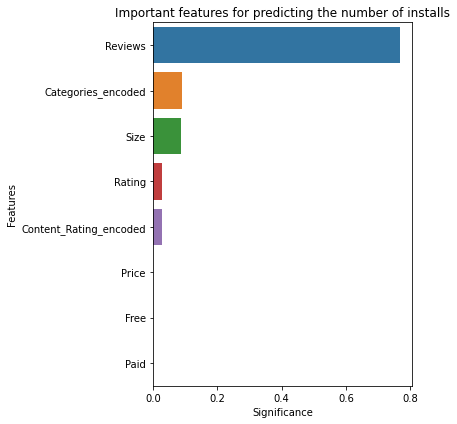

In [118]:
# Using barplot from seaborn to show importance of features in sorted manner.
feature_imp=pd.DataFrame(sorted(zip(Randomforestreg.feature_importances_,Application_data[["Reviews","Size","Rating","Price","Paid","Free","Categories_encoded","Content_Rating_encoded"]])),columns=["Significance","Features"])
fig=plt.figure(figsize=(6,6))
sns.barplot(x="Significance",y="Features",data=feature_imp.sort_values(by="Significance",ascending=False),dodge=False)
plt.title("Important features for predicting the number of installs")
plt.tight_layout()
plt.show()

In [119]:

from sklearn.metrics import r2_score,mean_squared_error

In [120]:
# The performance of random forest.
print('R^2 Training Score: {:.2f} \nOOB Score: {:.2f} \nR^2 Validation Score: {:.2f}'.format(Randomforestreg.score(X_train, y_train), 
                                                                                             Randomforestreg.oob_score_,
                                                                                             Randomforestreg.score(X_test, y_test)))

R^2 Training Score: 0.98 
OOB Score: 0.85 
R^2 Validation Score: 0.90


In [121]:
# Accuracy score for random forest
randomforestscore=Randomforestreg.score(X_test,y_test)
randomforestscore

0.8951557387296157

In [122]:
# Importing the performance metrics
from sklearn import metrics

In [123]:
# Mean absolute error
metrics.mean_absolute_error(y_test,y_prediction_randomforest)

5595700.063982206

In [124]:
# Root mean squared error
rmerandom=np.sqrt(metrics.mean_absolute_error(y_test,y_prediction_randomforest))
rmerandom

2365.5232114655323

#### <font color='blue'>The final step to compare our models accuracy for this task. We will be comparing the accuracy score and the root mean square error for all the 3 models. For that to achieve, we need to create a dataframe that consists of the accuracy score and root mean square error for each model and then we can plot that dataframe.

In [125]:
# Creating the dataframe that has accuracy score and root mean squared error for all the 3 models.
dict={"Linear Regressor":[linearregressionscore,rmelinear],"DecisionTree Regressor":[decisiontreescore,rmetree],"RandomForest Regressor":[randomforestscore,rmerandom]}
df_comparison_models=pd.DataFrame(dict,["Score","Root Mean Square Error"])

In [126]:
df_comparison_models.head()

,Linear Regressor,DecisionTree Regressor,RandomForest Regressor
Score,0.482331,0.879099,0.895156
Root Mean Square Error,4046.697639,2027.278497,2365.523211


Text(0.5, 1.0, 'Model Accuracy')

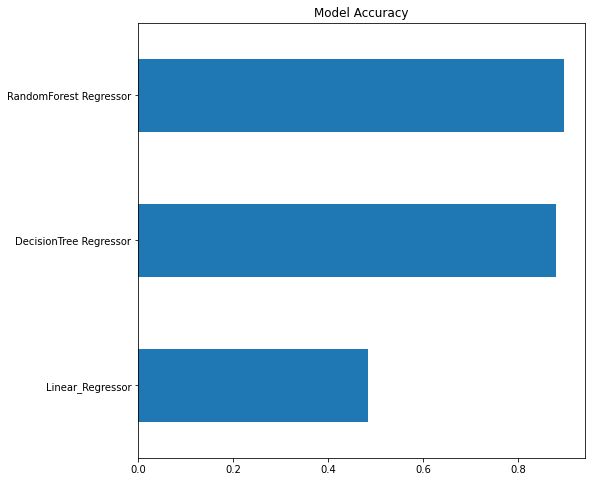

In [127]:
# Plotting the accuracy of all the 3 models
%matplotlib inline
model_accuracy = pd.Series(data=[linearregressionscore,decisiontreescore,randomforestscore], 
        index=['Linear_Regressor','DecisionTree Regressor','RandomForest Regressor'])
fig= plt.figure(figsize=(8,8))
model_accuracy.sort_values().plot.barh()
plt.title('Model Accuracy')

Text(0.5, 1.0, 'Model Root Mean Squared Error')

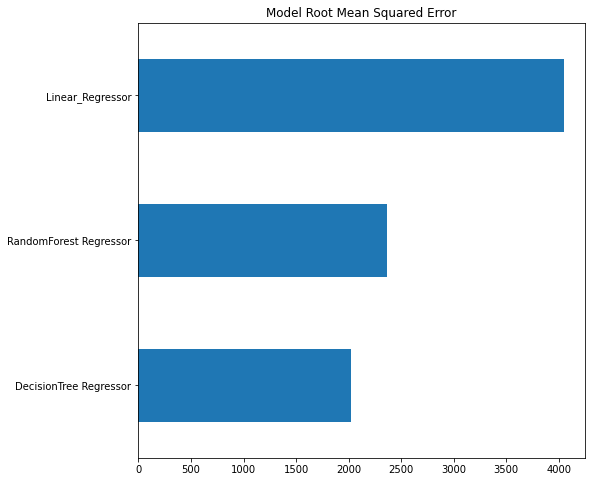

In [128]:
# Plotting the Root Mean Squared Error comaparison
%matplotlib inline
model_accuracy = pd.Series(data=[rmelinear,rmetree,rmerandom], 
        index=['Linear_Regressor','DecisionTree Regressor','RandomForest Regressor'])
fig= plt.figure(figsize=(8,8))
model_accuracy.sort_values().plot.barh()
plt.title('Model Root Mean Squared Error')

In [157]:
! pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 177.5 MB 41 kB/s 
  Created wheel for h2o: filename=h2o-3.38.0.3-py2.py3-none-any.whl size=177541401 sha256=364ff7ecef09e7e34fab53e45fba68264301859b94fe1423f34842cf560d0fd2
  Stored in directory: /root/.cache/pip/wheels/16/f8/f4/69e1ff6a0d1cb61bdbc0d9888ee8437a1acf1eb1c6ffb8be20
Successfully built h2o


In [160]:
from h2o.automl import H2OAutoML
import h2o

In [161]:
h2o.init() # initalize H2O

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.17" 2022-10-18; OpenJDK Runtime Environment (build 11.0.17+8-post-Ubuntu-1ubuntu218.04); OpenJDK 64-Bit Server VM (build 11.0.17+8-post-Ubuntu-1ubuntu218.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.8/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpem8zaxc9
  JVM stdout: /tmp/tmpem8zaxc9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpem8zaxc9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.3
H2O_cluster_version_age:,22 days
H2O_cluster_name:,H2O_from_python_unknownUser_6jjdwn
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [164]:
from google.colab import drive

In [165]:
drive.mount('/content/drive') # connect drive

Mounted at /content/drive


Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,1 min 49 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.3
H2O_cluster_version_age:,22 days
H2O_cluster_name:,H2O_from_python_unknownUser_6jjdwn
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
00:25:01.740: XGBoost_1_AutoML_1_20221216_02500 [XGBoost def_2] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_1_AutoML_1_20221216_02500_cv_1.  Details: ERRR on field: _response_column: Response contains missing values (NAs) - not supported by XGBoost.


██████████████████████████████████████████████
00:25:44.988: XGBoost_2_AutoML_1_20221216_02500 [XGBoost def_1] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_2_AutoML_1_20221216_02500_cv_1.  Details: ERRR on field: _response_column: Response contains missing values (NAs) - not supported by XGBoost.


███████████████
00:25:59.411: XGBoost_3_AutoML_1_20221216_02500 [XGBoost def_3] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_3_Au

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_1_AutoML_1_20221216_02500,0.497546,0.247552,0.331852,0.113898,0.247552,1052,0.014166,GBM
GBM_2_AutoML_1_20221216_02500,0.501892,0.251895,0.342322,0.114919,0.251895,469,0.008955,GBM
StackedEnsemble_AllModels_1_AutoML_1_20221216_02500,0.501895,0.251899,0.342163,0.114812,0.251899,656,0.024732,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20221216_02500,0.501895,0.251899,0.342163,0.114812,0.251899,701,0.013453,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20221216_02500,0.503979,0.253995,0.344189,0.115211,0.253995,594,0.022041,StackedEnsemble
GBM_3_AutoML_1_20221216_02500,0.506199,0.256237,0.345666,0.115588,0.256237,432,0.00558,GBM
GBM_4_AutoML_1_20221216_02500,0.510972,0.261092,0.350807,0.116459,0.261092,406,0.003556,GBM
GLM_1_AutoML_1_20221216_02500,0.516477,0.266748,0.351693,0.117566,0.266748,1059,0.0061,GLM
DRF_1_AutoML_1_20221216_02500,0.633785,0.401683,0.405871,0.141733,0.401683,323,0.002588,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

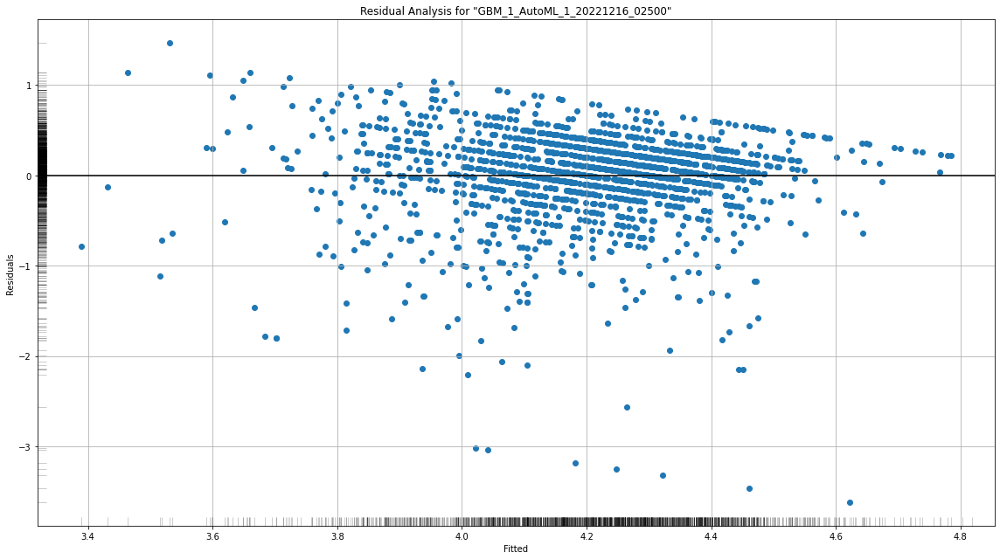

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

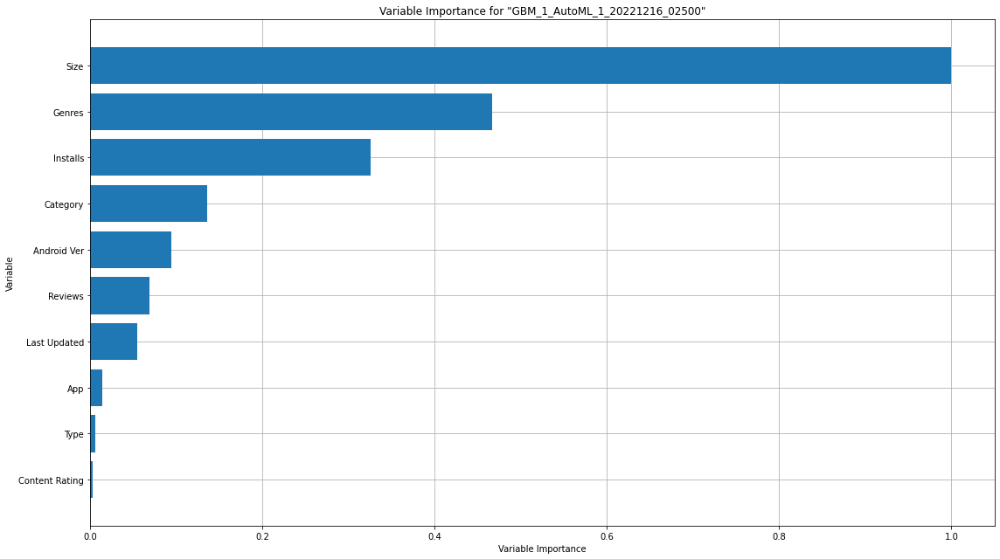

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

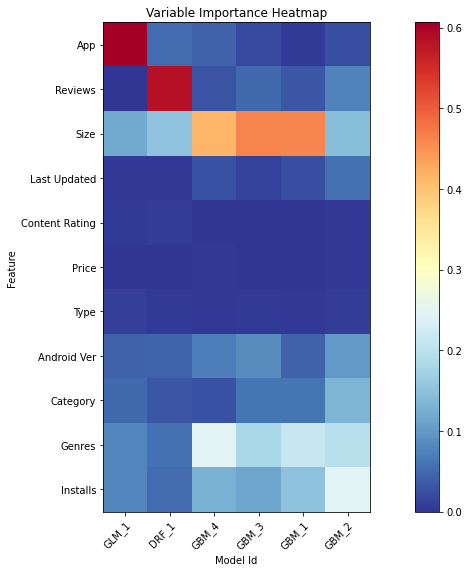

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

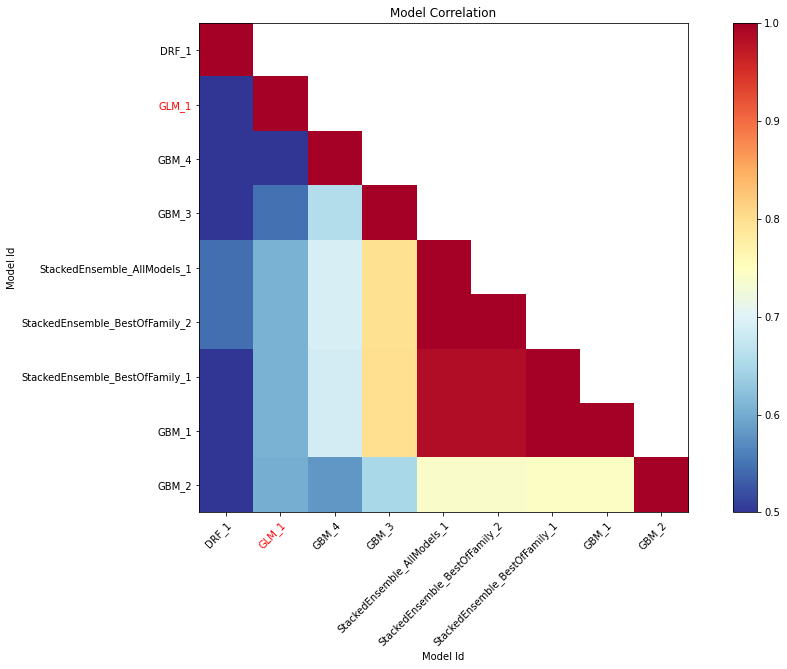

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

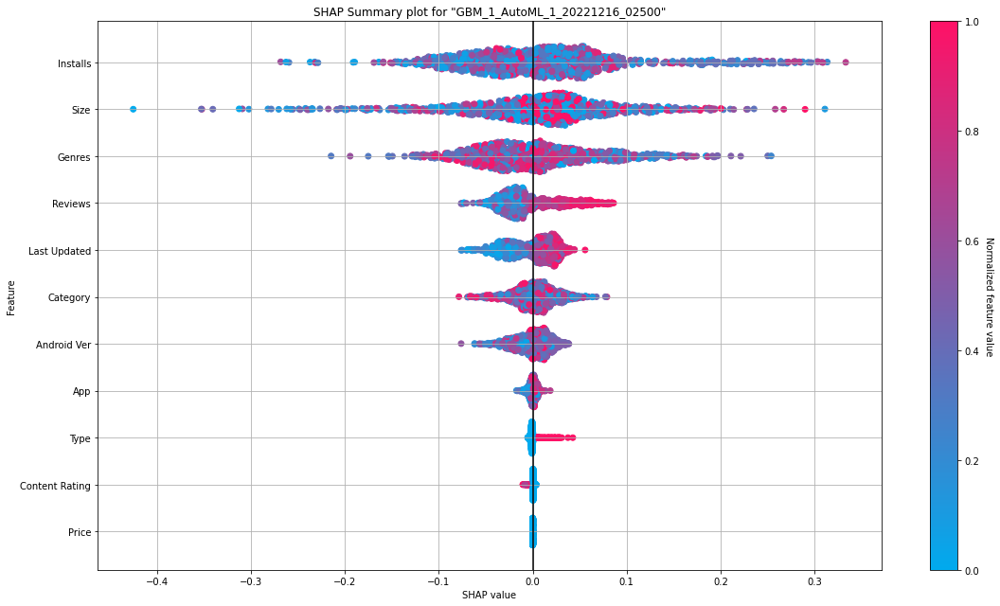

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

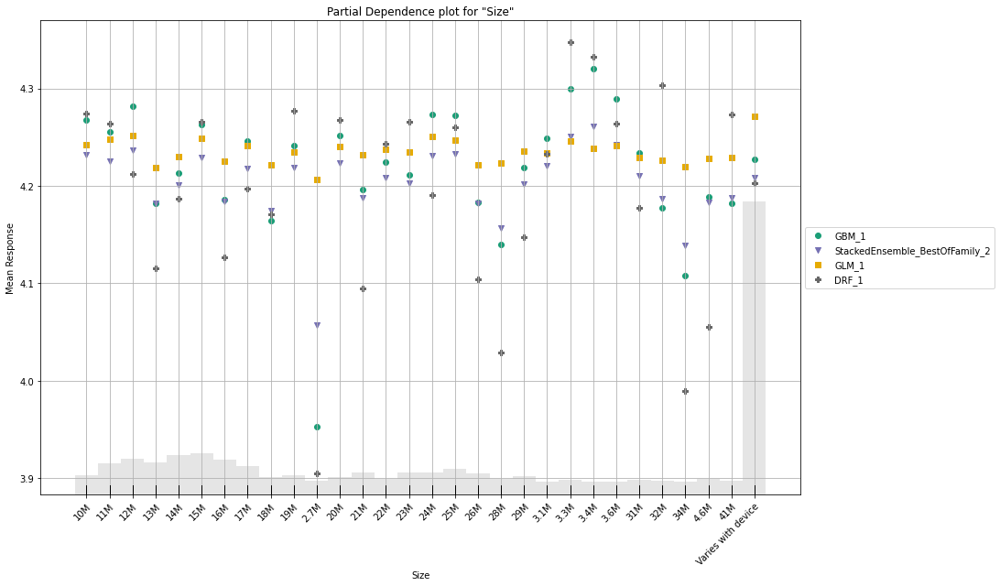

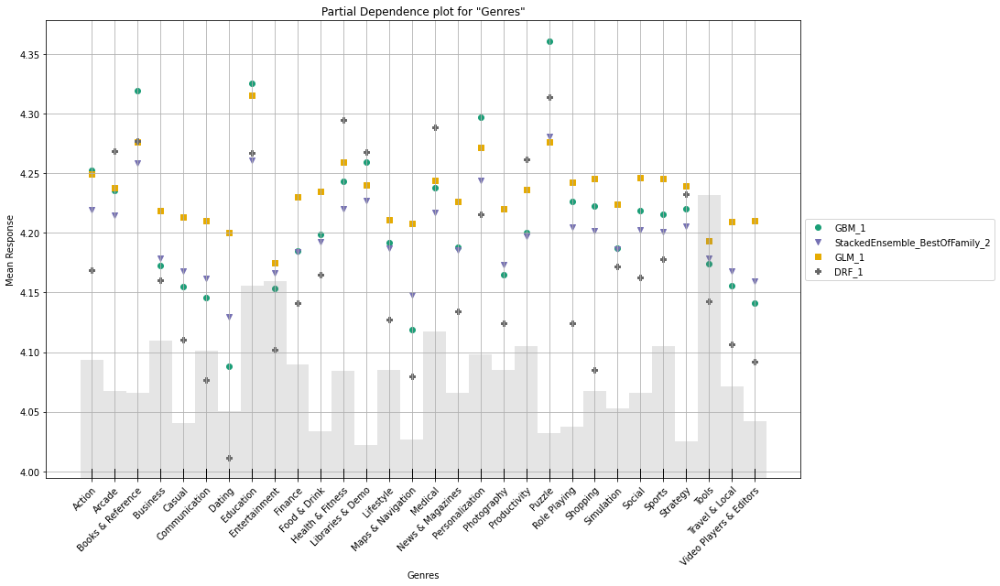

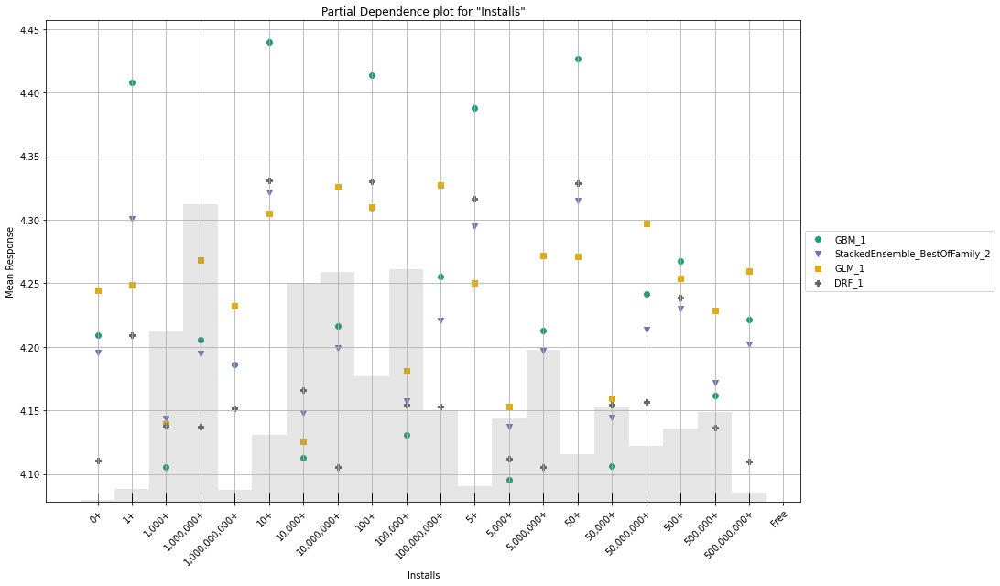

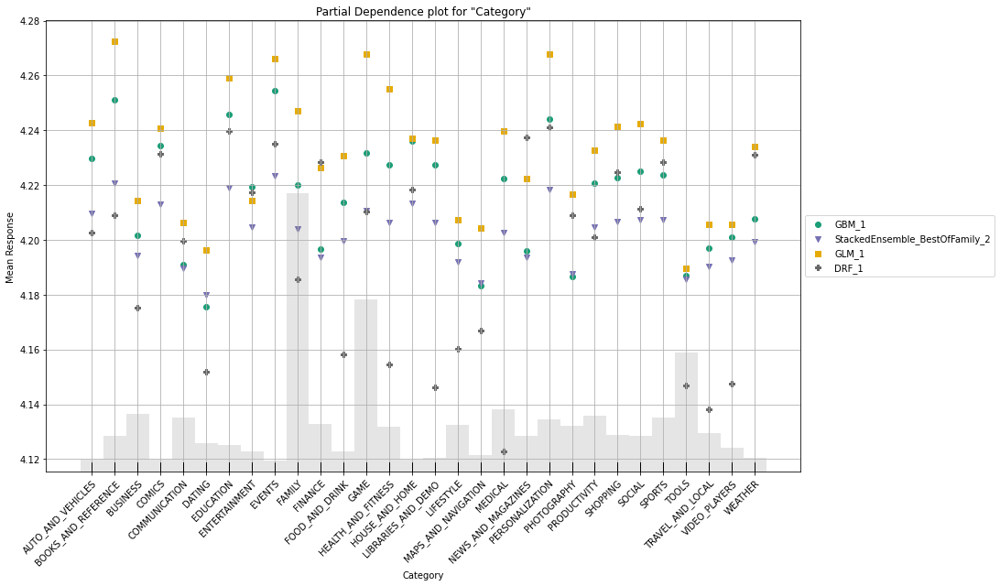

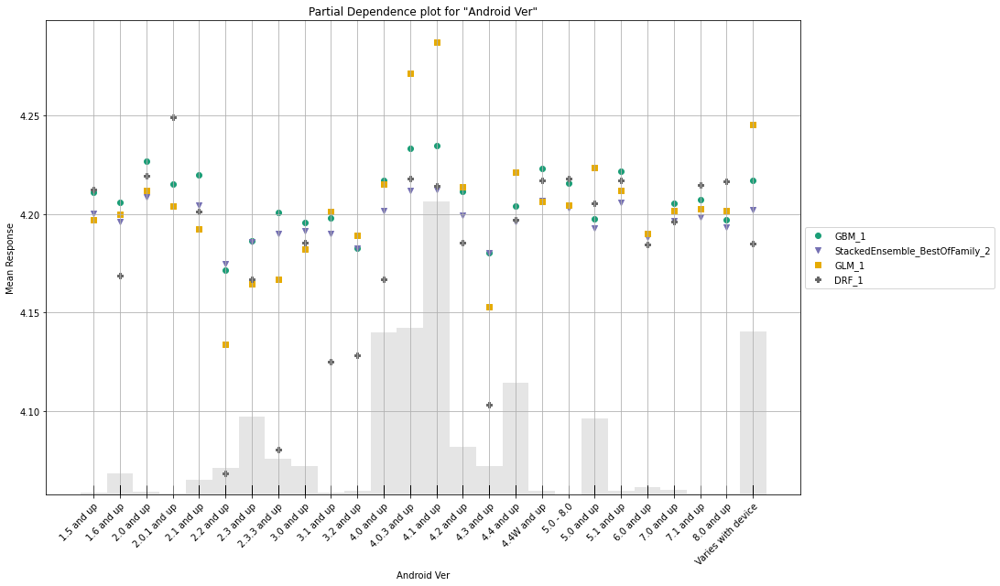

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

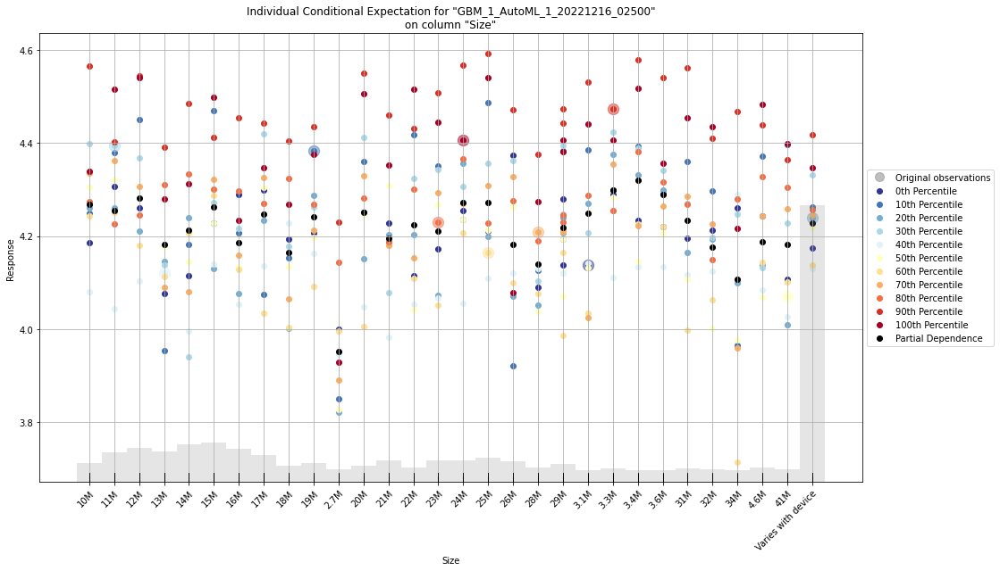

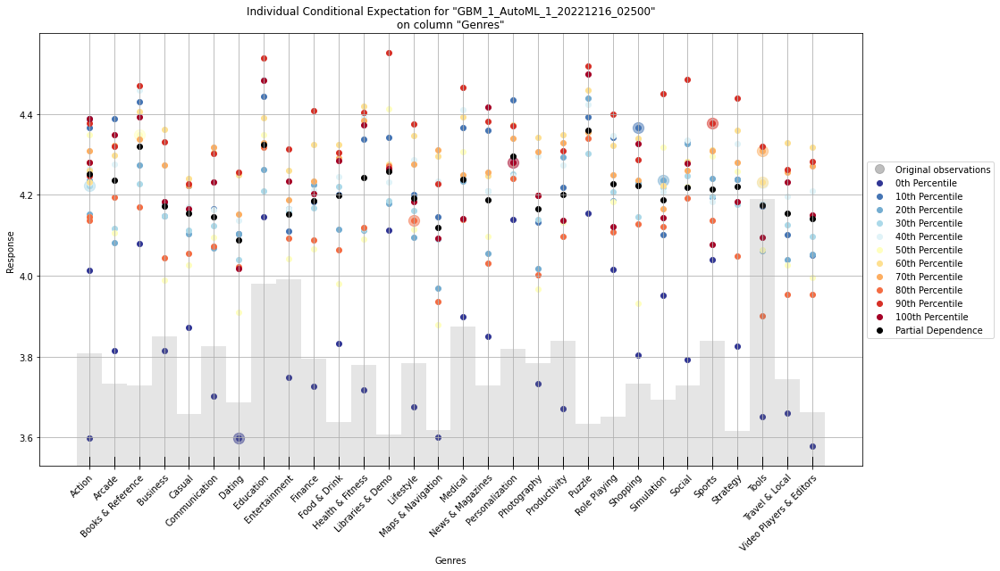

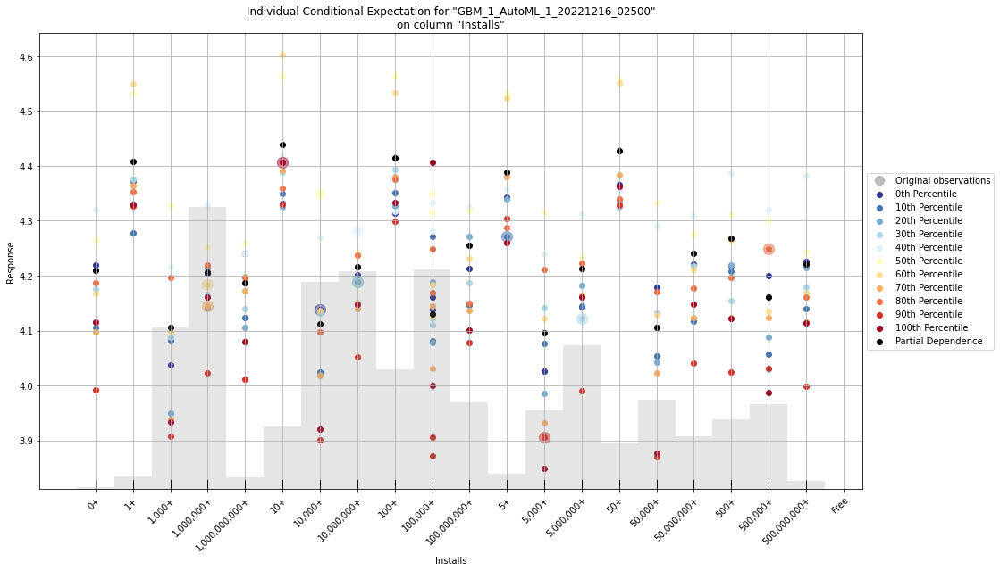

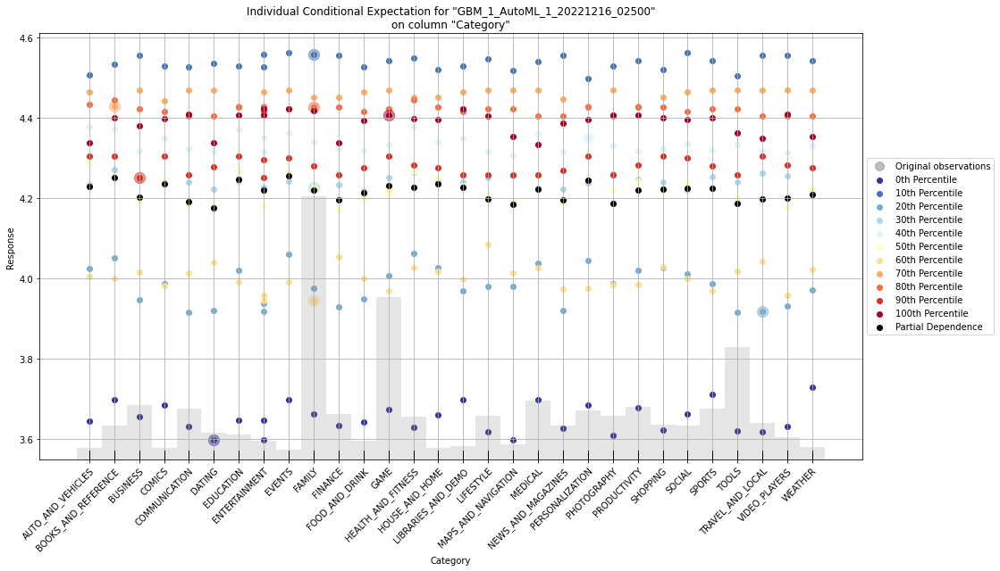

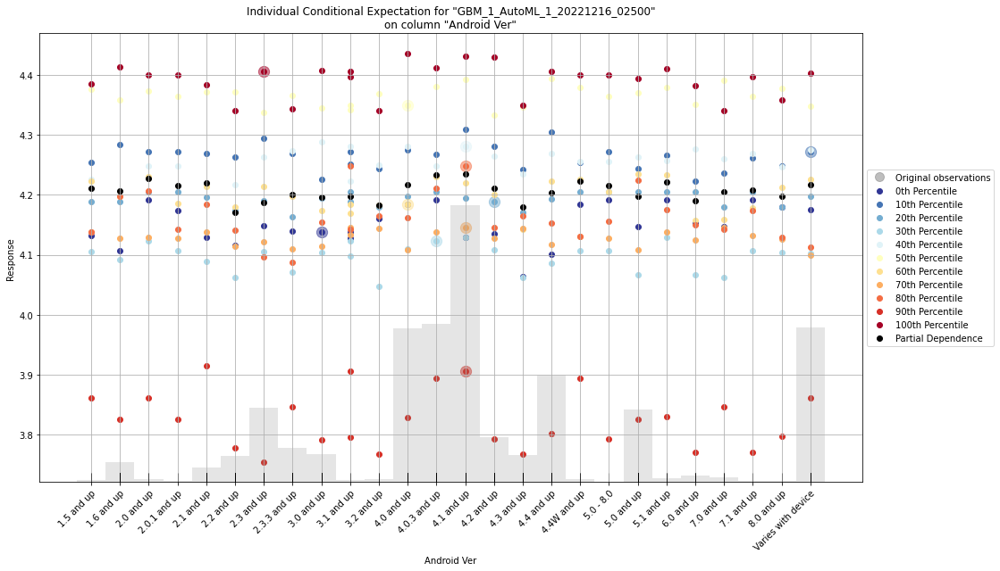

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

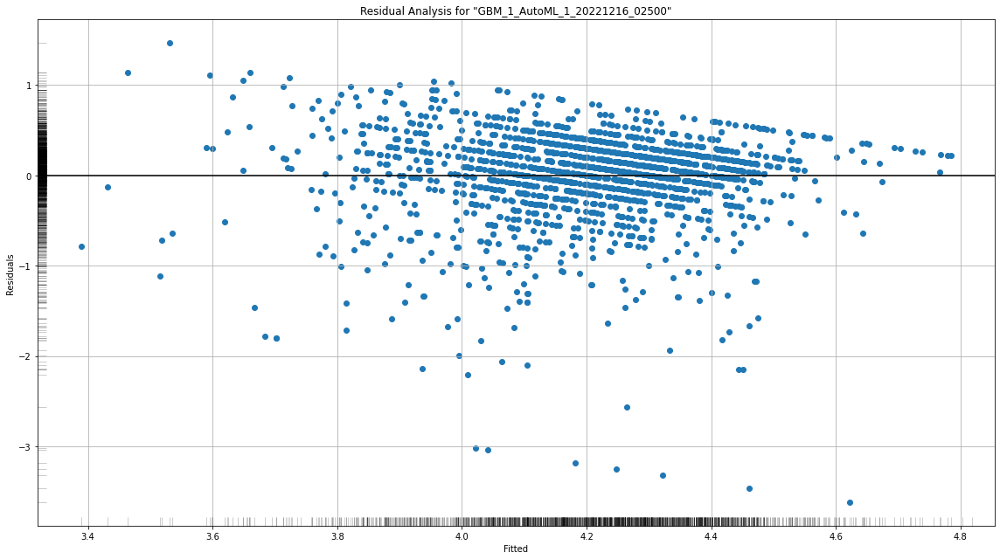

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

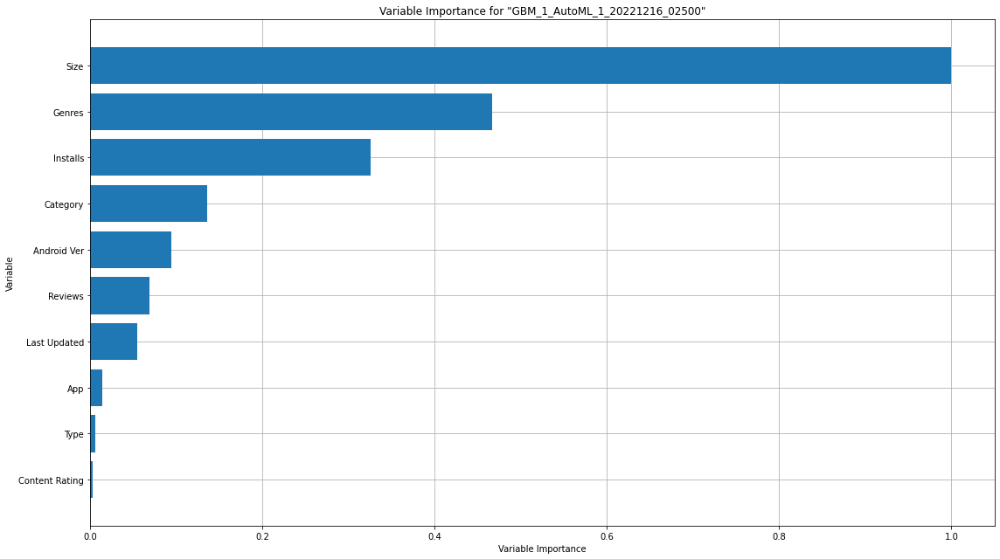

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

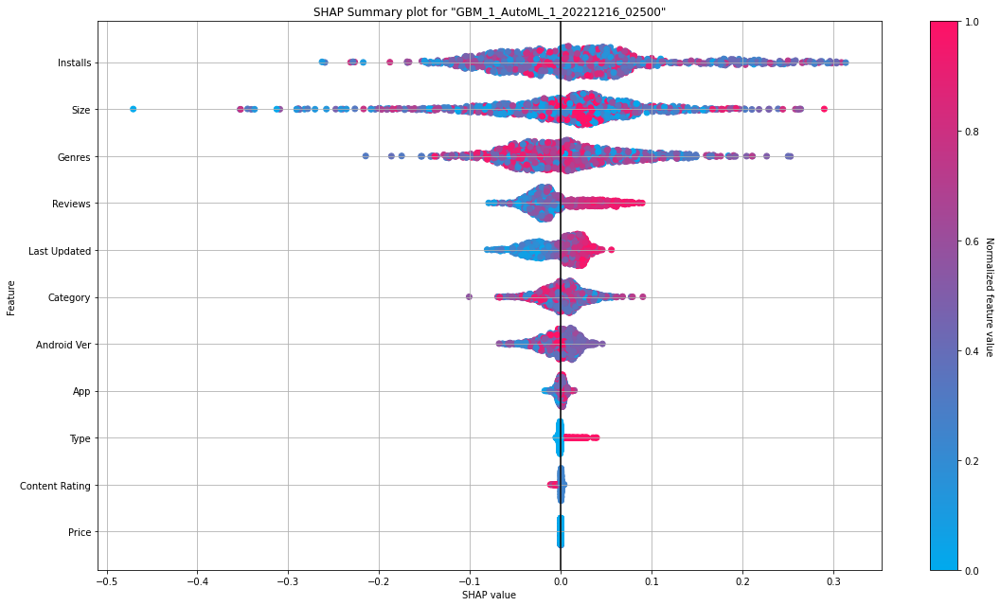

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

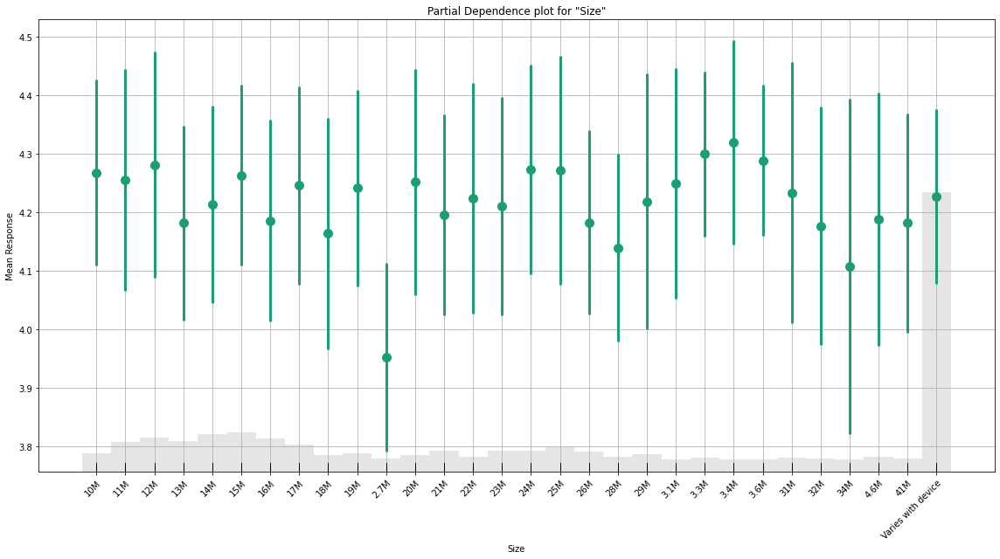

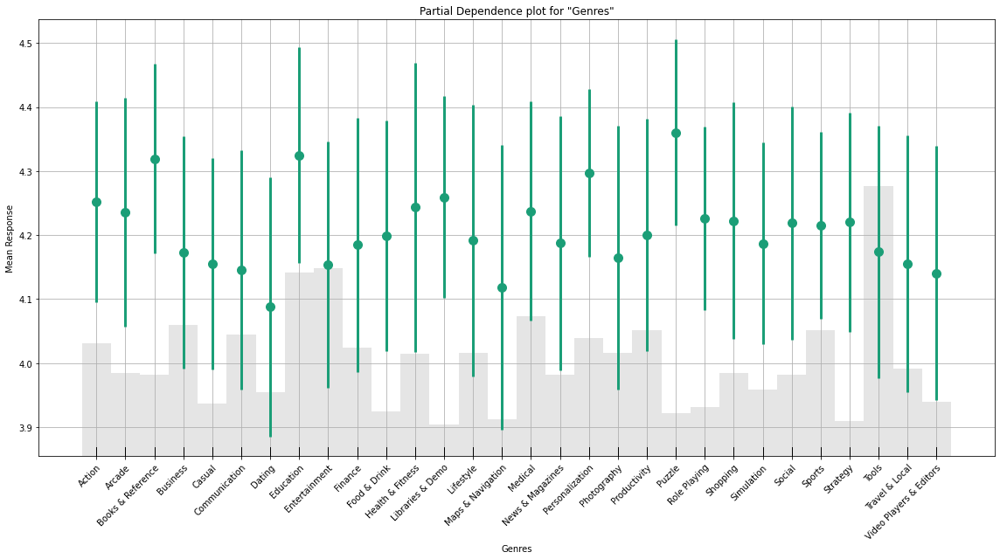

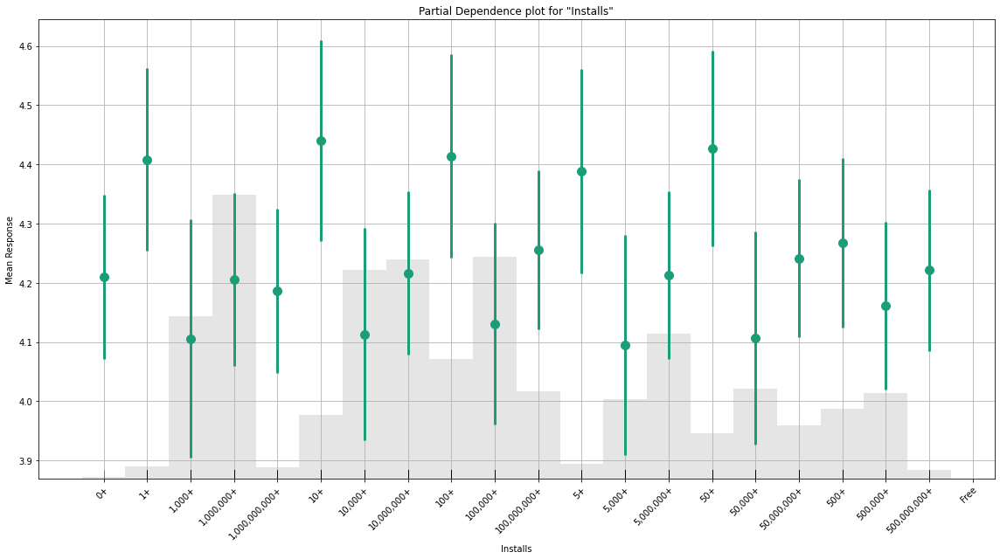

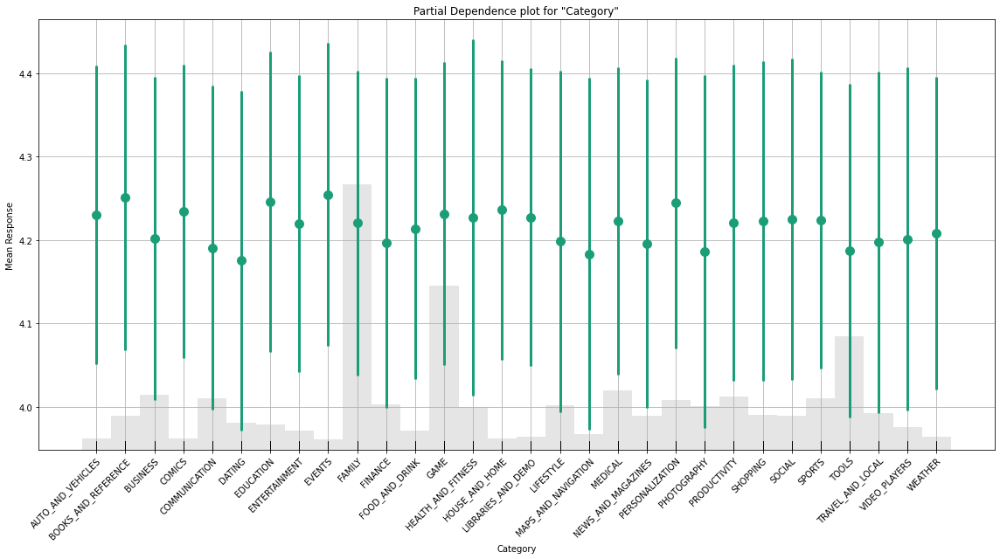

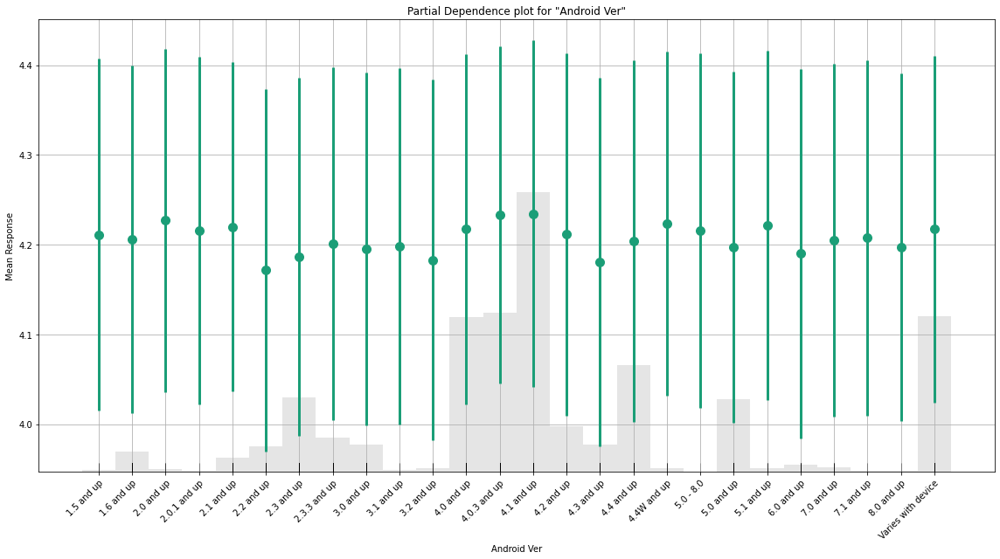

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

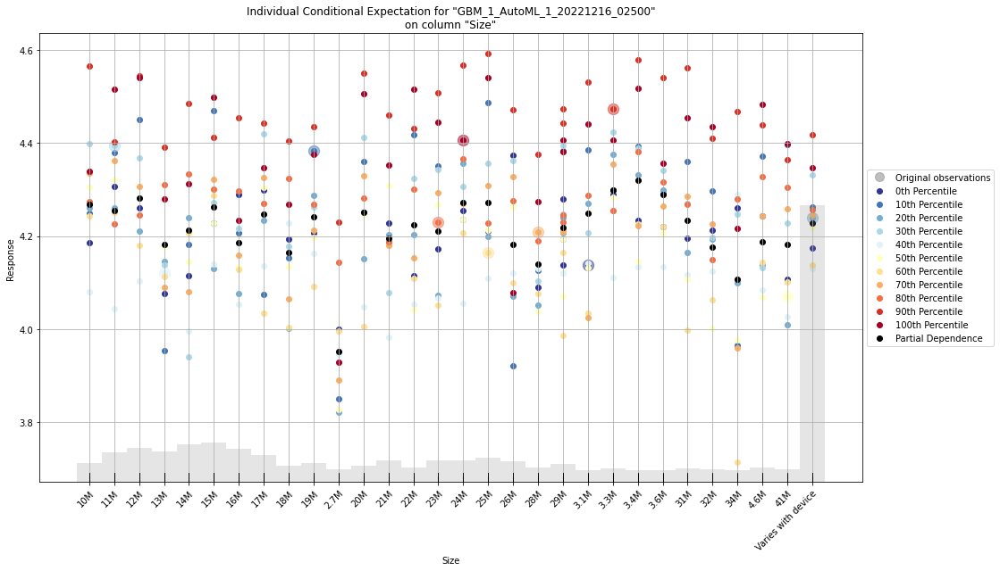

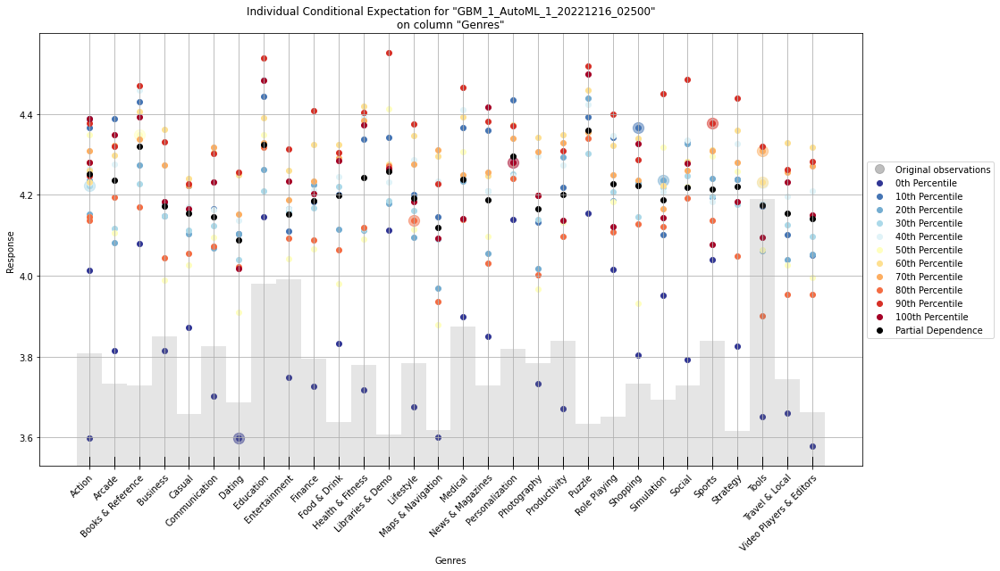

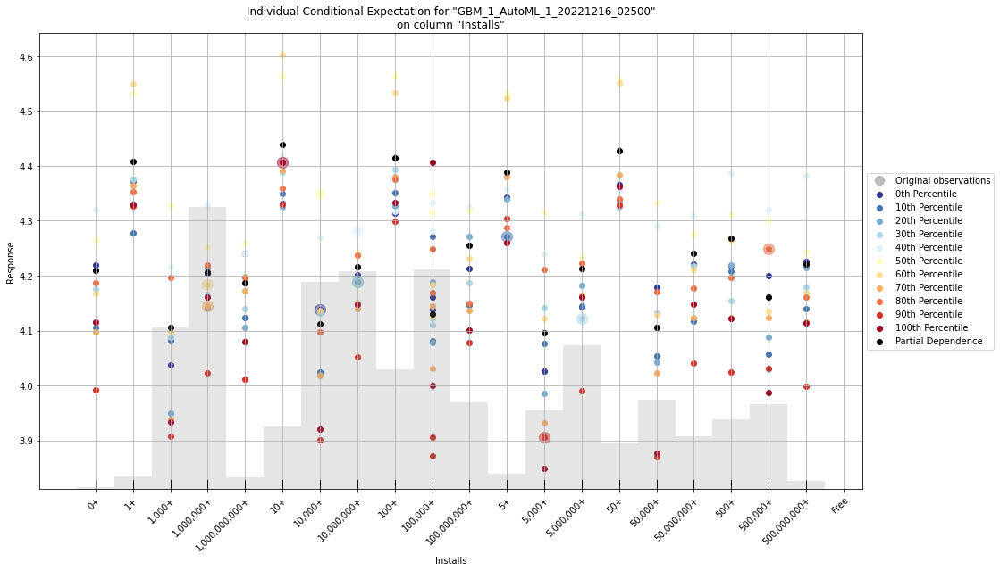

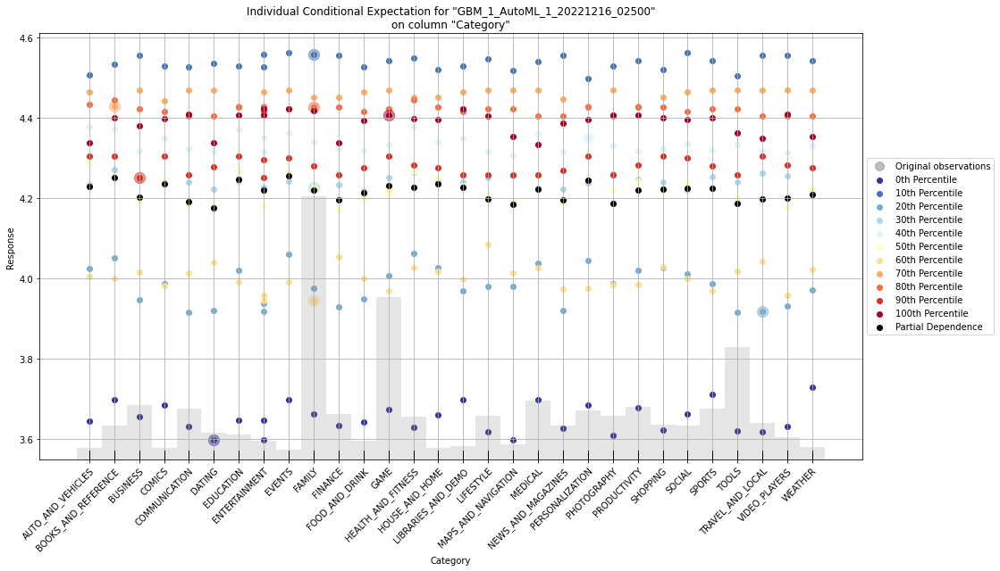

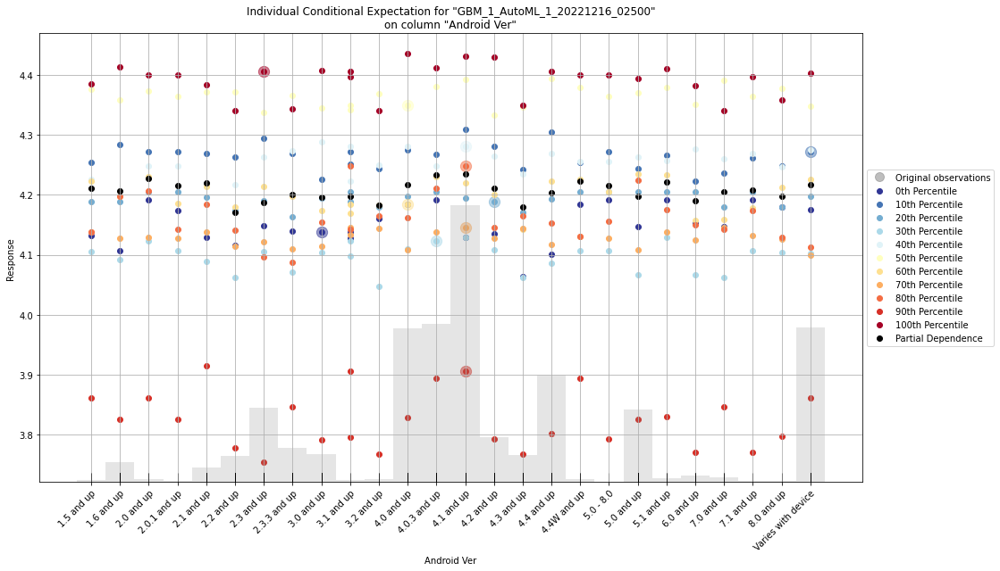

In [166]:
import h2o
from h2o.automl import H2OAutoML

h2o.init()

# Import dataset
df = h2o.import_file('/content/drive/MyDrive/AutoML/googleplaystore.csv') # import file from drive as h2O needs to restart

# Reponse column
y = "Rating"

# Split into train & test
splits = df.split_frame(ratios = [0.8], seed = 1)
train = splits[0]
test = splits[1]

# Run AutoML for 1 minute
aml = H2OAutoML(max_runtime_secs=60, seed=1)
aml.train(y=y, training_frame=train)

# Explain leader model & compare with all AutoML models
exa = aml.explain(test)

# Explain a single H2O model (e.g. leader model from AutoML)
exm = aml.leader.explain(test)


# Leaderboard

> Leaderboard shows models with their metrics and their predictions for a given row. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo,predict
GBM_1_AutoML_1_20221216_02500,0.497546,0.247552,0.331852,0.113898,0.247552,1052,0.014166,GBM,4.41564
GBM_2_AutoML_1_20221216_02500,0.501892,0.251895,0.342322,0.114919,0.251895,469,0.008955,GBM,4.27574
StackedEnsemble_AllModels_1_AutoML_1_20221216_02500,0.501895,0.251899,0.342163,0.114812,0.251899,656,0.024732,StackedEnsemble,4.3006
StackedEnsemble_BestOfFamily_2_AutoML_1_20221216_02500,0.501895,0.251899,0.342163,0.114812,0.251899,701,0.013453,StackedEnsemble,4.3006
StackedEnsemble_BestOfFamily_1_AutoML_1_20221216_02500,0.503979,0.253995,0.344189,0.115211,0.253995,594,0.022041,StackedEnsemble,4.30819
GBM_3_AutoML_1_20221216_02500,0.506199,0.256237,0.345666,0.115588,0.256237,432,0.00558,GBM,4.30191
GBM_4_AutoML_1_20221216_02500,0.510972,0.261092,0.350807,0.116459,0.261092,406,0.003556,GBM,4.30165
GLM_1_AutoML_1_20221216_02500,0.516477,0.266748,0.351693,0.117566,0.266748,1059,0.0061,GLM,4.32742
DRF_1_AutoML_1_20221216_02500,0.633785,0.401683,0.405871,0.141733,0.401683,323,0.002588,DRF,4.1


# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

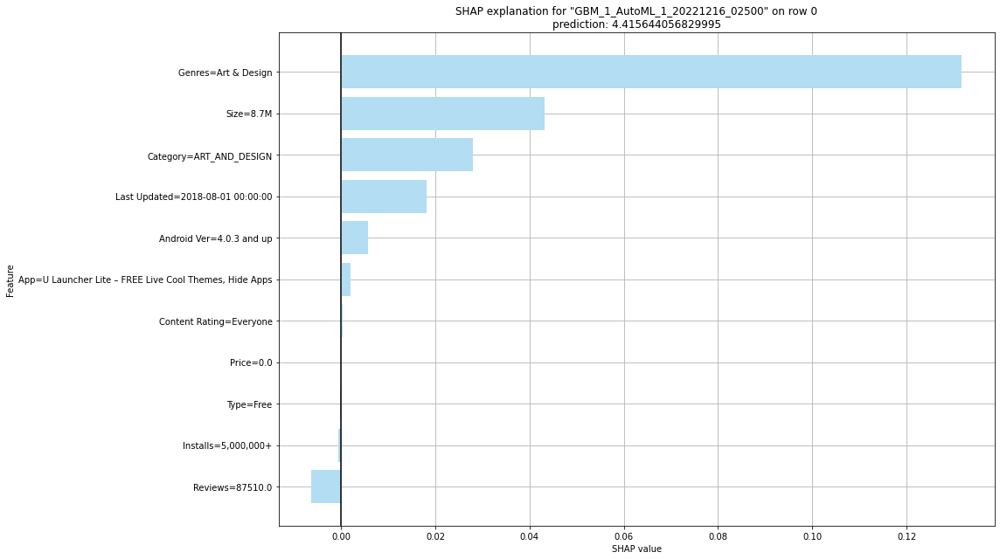

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

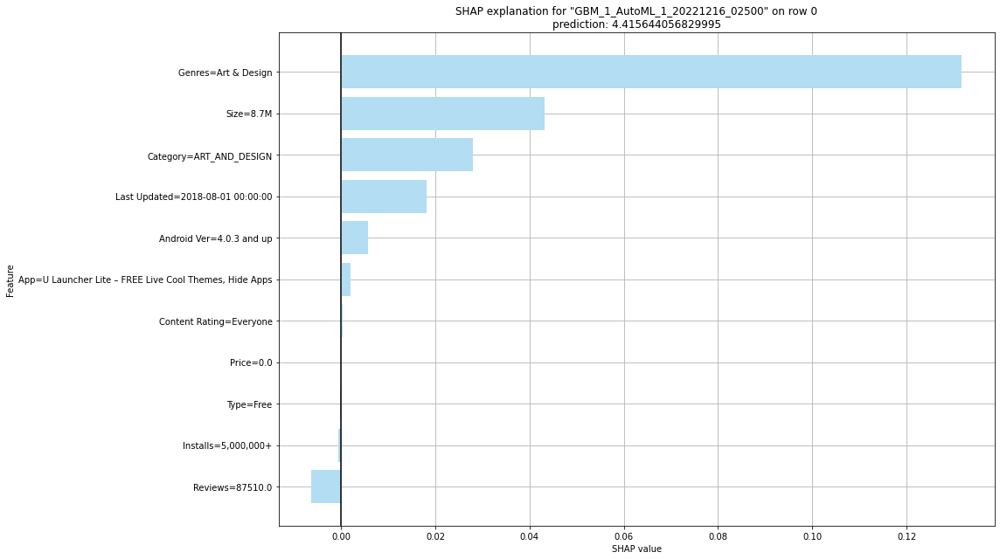

# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

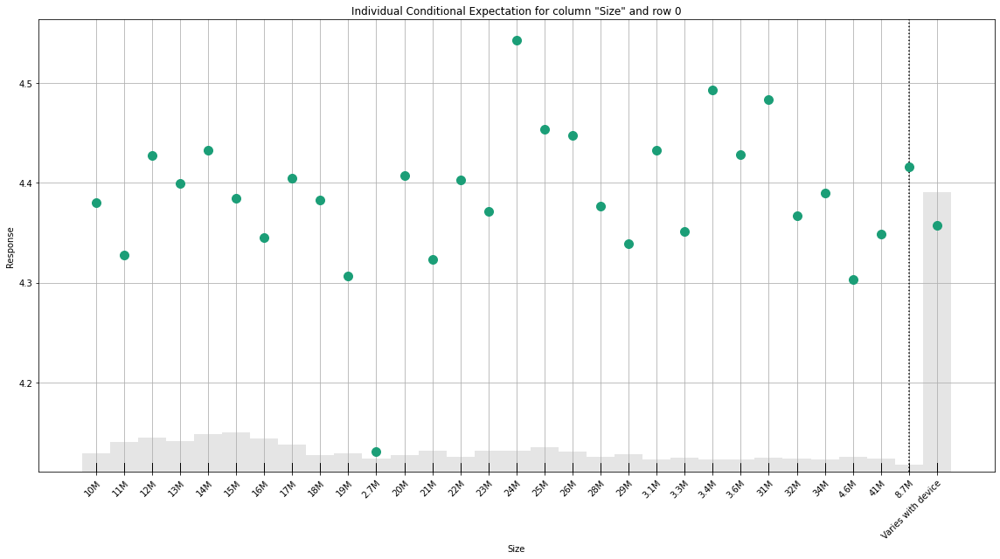

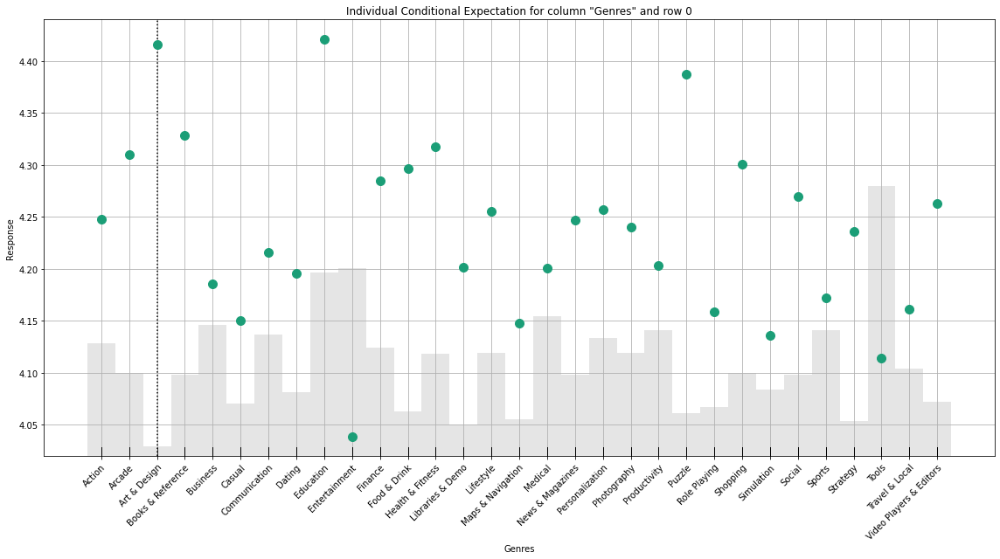

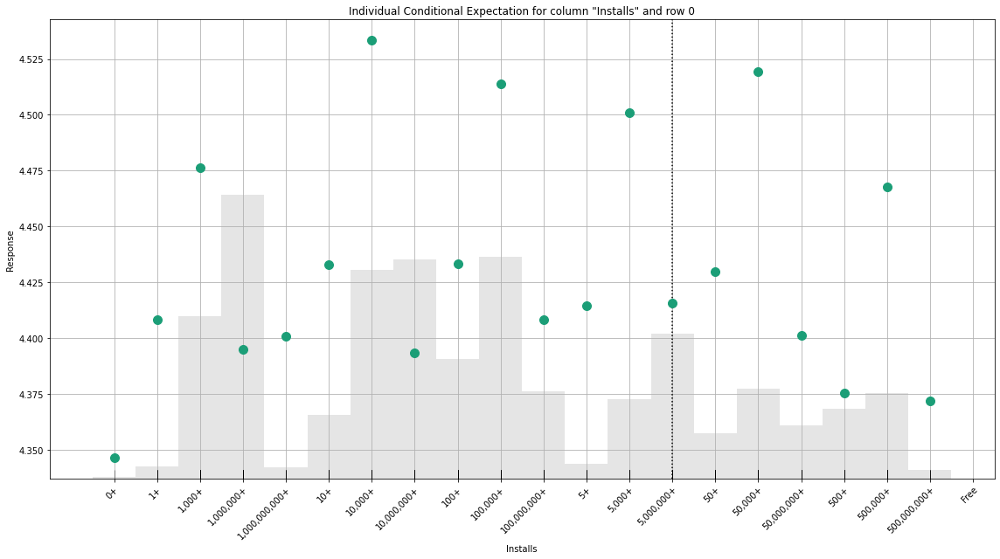

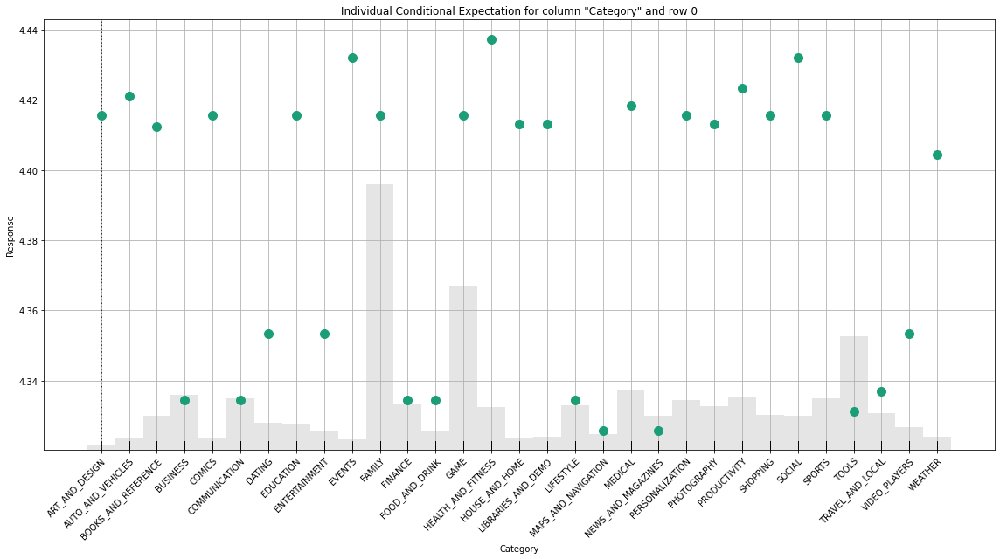

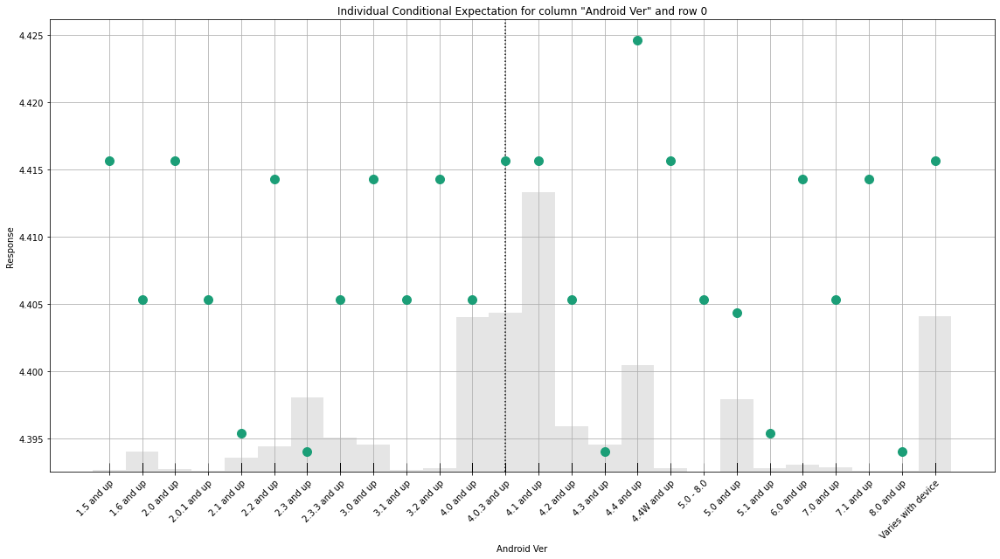

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

In [167]:
# Explain first row with all AutoML models
aml.explain_row(test, row_index=0)

# Explain first row with a single H2O model (e.g. leader model from AutoML)
aml.leader.explain_row(test, row_index=0)

# Explain a generic list of models
# use h2o.explain as follows:
# exl = h2o.explain(model_list, test, row_index=0)

# <font color='red'>FINAL THOUGHTS

### This was all about this dataset, where we performed all the process from the scratch. We <font color='red'>loaded the data, cleaned the features, did a thorough exploratory data analysis</font> to understand which will be the key features that will be vital for predicting our target variable, finally created the models and made some predictions. Ran <font color='red'>AutoML H2o</font> and found out which model has high accuracy. At the last <font color='red'>compared the accuracy of all the models</font> on which the analysis was performed. 

1. <font color='red'>What is the question?
 - the onl;y imporatant question is how we can get value from the dataset. 

2. <font color='red'>What did you do?
- we cleaned the data first then we did exploratory data analysis to understand which will be the key features that will be vital for predicting our target variable, finally created the models and made some predictions.

3. <font color='red'>How well did it work?
- It worked really well with the data set and we got to know that Installs, Rating and size are important independent variable for predictions and paid/free is important for number of reviews(dependent variable). 

4. <font color='red'>What did you learn?
- we learnt that there are many ways to get value out of the dataset but its important to find which are the independent variables and which are the models that get the most out of the datset.